In [1]:
import numpy as np
import scipy as sp
import sympy as smp
import matplotlib.pyplot as plt
import pandas as pd #Lo necesito para cargar y leer el csv

import os
import random
import time
from datetime import datetime

import tensorflow
from tensorflow.keras.layers import Dense, LSTM
from tensorflow.keras.models import Sequential #

2025-07-26 19:32:43.985413: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# **Modelo cinemático del robot IRB 140**

Modelo cinemático del robot IRB 140 para determinar si los puntos que serán generados de forma random son válidos: el robot puede llegar a esa Valocidad de forma cartesiana sin cambiar la configuración en el trayecto.


**Robot sin hombro:** los ejes 1, 4 y 6 son coplanares (estan en el mismo plano).


Por la definición de ternas utilizadas (longitudes en mm)

| EJE | D      | THETA   | ALPHA  | A      |
| :-- | ------ | ------- | ------ | ------ |
| 1   | d1=352 | q1      | -90    | a1=70  |
| 2   | 0      | q2-90   | 0      | a2=360 |
| 3   | 0      | q3      | -90    | 0      |
| 4   | d4=380 | q4      | 90     | 0      |
| 5   | 0      | q5      | -90    | 0      |
| 6   | d6=65  | q6-180  | 0      | 0      |


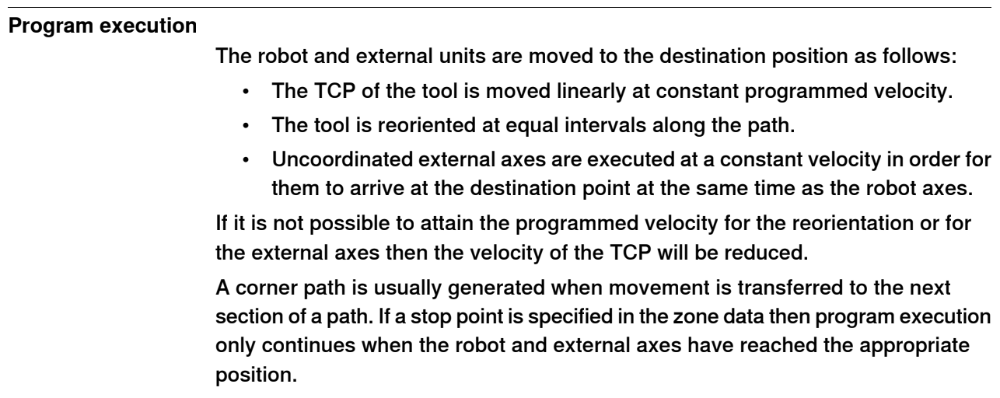

In [2]:
#Parametros DH del IRB140 Verificando segun robotstudio
a_irb140 = np.array([70, 360., 0, 0., 0, 0])
d_irb140 = np.array([352., 0, 0, 380, 0, 0])

#a_irb140 = np.array([70, 360., 0, 0., 0, 0])
#d_irb140 = np.array([0, 0, 0, 732, 0, -65])
alpha_irb140 = np.array([-1, 0, -1, 1, -1, 0]) * np.pi / 2.


# theta_irb140_real = theta_irb140 + thetas_correction
thetas_correction = np.array([0, -90, 0, 0, 0, -180]) * (np.pi/180)
theta_irb140 = np.array([52.8, -2, 10, 13, 56, 28]) * (np.pi/180) #Estos thetas son para probar

In [3]:
theta = smp.symbols('theta1:{0}'.format(7), real=True)
a = smp.symbols('a1:{0}'.format(7), real=True)
d = smp.symbols('d1:{0}'.format(7), real=True)
alpha = smp.symbols('alpha1:{0}'.format(7), real=True)

In [4]:
#Problema cinemático directo
def symbolic_irb140_forward_kinematics():
  J = []
  for i in range(6):
      # Use symbolic expressions for DH parameters
      A_i = smp.Matrix([
          [smp.cos(theta[i]), -smp.sin(theta[i]) * smp.cos(alpha[i]), smp.sin(theta[i]) * smp.sin(alpha[i]), a[i] * smp.cos(theta[i])],
          [smp.sin(theta[i]), smp.cos(theta[i]) * smp.cos(alpha[i]), -smp.cos(theta[i]) * smp.sin(alpha[i]), a[i] * smp.sin(theta[i])],
          [0.0, smp.sin(alpha[i]), smp.cos(alpha[i]), d[i]],
          [0.0, 0.0, 0.0, 1.0]
      ])
      J.append(A_i)
      J[i] = smp.simplify(J[i])

  A_0_n = J[0]
  for matrix in range(5):
    A_0_n = A_0_n * J[matrix+1]

  #A_0_n
  J.append(A_0_n)
  return J

In [5]:
def irb140_forward_kinematics(J, thetas):
    sym_expressions = [
      [expr for expr in row] for row in J
    ]

    lambdified_expr = np.array([
          [smp.lambdify((a, d, alpha, theta), expr, 'numpy') for expr in J[i]]
          for i in range(6+1)
      ])

    matrices = []
    for row in lambdified_expr:
        T = np.block([expr(a_irb140, d_irb140, alpha_irb140, thetas) for expr in row])
        matrices.append(T)
    replaced_matrixes = np.array(matrices)
    replaced_matrixes = np.asarray(replaced_matrixes).reshape(replaced_matrixes.shape[0], 4, 4)
    return replaced_matrixes

In [6]:
J_sym = symbolic_irb140_forward_kinematics()
J_matrix = irb140_forward_kinematics(J_sym, theta_irb140+thetas_correction)
J_06 = irb140_forward_kinematics(J_sym, theta_irb140+thetas_correction)[-1,0:3,3]
J_06#Funciona con la verificación ya que para el theta de prueba me da lo mismo q en robotstudio array([269.92581072, 375.66383285, 601.84099693])

array([262.23763949, 345.48533127, 658.89491936])

In [7]:
#print(smp.latex(J_sym[6]))
symbolic_constants = {
    smp.symbols('alpha1', real=True): alpha_irb140[0],
    smp.symbols('alpha2', real=True): alpha_irb140[1],
    smp.symbols('alpha3', real=True): alpha_irb140[2],
    smp.symbols('alpha4', real=True): alpha_irb140[3],
    smp.symbols('alpha5', real=True): alpha_irb140[4],
    smp.symbols('alpha6', real=True): alpha_irb140[5],
    smp.symbols('a3', real=True): a_irb140[2],
    smp.symbols('a4', real=True): a_irb140[3],
    smp.symbols('a5', real=True): a_irb140[4],
    smp.symbols('a6', real=True): a_irb140[5],
    smp.symbols('d2', real=True): d_irb140[1],
    smp.symbols('d3', real=True): d_irb140[2],
    smp.symbols('d5', real=True): d_irb140[4],
    smp.symbols('d6', real=True): d_irb140[5],
    smp.symbols('theta2', real=True): smp.symbols('theta2', real=True) - (90 * smp.pi/180),
}

# Realizar las sustituciones en la expresión simbólica
J_sym_substituted = [expr.subs(symbolic_constants) for expr in J_sym[6]]
J_sym_substituted = [expr.rewrite(smp.sin, smp.cos) for expr in J_sym_substituted]
J_sym_substituted = [smp.nsimplify(expr, tolerance=1e-10) for expr in J_sym_substituted]


J_sym_substituted[0]

(((cos(theta1)*cos(theta2)*cos(theta3 - pi/2) + cos(theta1)*cos(theta3)*cos(theta2 - pi/2))*cos(theta4) + cos(theta1 - pi/2)*cos(theta4 - pi/2))*cos(theta5) + (cos(theta1)*cos(theta2)*cos(theta3) - cos(theta1)*cos(theta2 - pi/2)*cos(theta3 - pi/2))*cos(theta5 - pi/2))*cos(theta6) + (-(cos(theta1)*cos(theta2)*cos(theta3 - pi/2) + cos(theta1)*cos(theta3)*cos(theta2 - pi/2))*cos(theta4 - pi/2) + cos(theta4)*cos(theta1 - pi/2))*cos(theta6 - pi/2)

In [8]:
smp.trigsimp(J_sym_substituted[3])

(a1 + a2*sin(theta2) + d4*cos(theta2 + theta3))*cos(theta1)

In [9]:
J_sym[0]

Matrix([
[cos(theta1), -sin(theta1)*cos(alpha1),  sin(alpha1)*sin(theta1), a1*cos(theta1)],
[sin(theta1),  cos(alpha1)*cos(theta1), -sin(alpha1)*cos(theta1), a1*sin(theta1)],
[        0.0,              sin(alpha1),              cos(alpha1),             d1],
[        0.0,                      0.0,                      0.0,            1.0]])

In [10]:
px_s = smp.symbols('px', real=True)
py_s = smp.symbols('py', real=True)
pz_s = smp.symbols('pz', real=True)

point_matrix = smp.Matrix(4,1,[px_s, py_s, pz_s, 1])

point_matrix

Matrix([
[px],
[py],
[pz],
[ 1]])

In [11]:
J_01_sym_substituted = [expr.subs(symbolic_constants) for expr in J_sym[0]]
J_01_sym_substituted = [expr.rewrite(smp.sin, smp.cos) for expr in J_01_sym_substituted]
J_01_sym_substituted = [smp.nsimplify(expr, tolerance=1e-10) for expr in J_01_sym_substituted]
J_01_sym_substituted = [smp.trigsimp(expr) for expr in J_01_sym_substituted]
J_01_sym_substituted =  smp.Matrix(4, 4, J_01_sym_substituted)
smp.trigsimp(J_01_sym_substituted.inv()*point_matrix)

Matrix([
[                                                                                                      -a1 + px*cos(theta1) + py*sin(theta1)],
[d1 - 612323399573677*px*sin(theta1)/10000000000000000000000000000000 + 612323399573677*py*cos(theta1)/10000000000000000000000000000000 - pz],
[                                                                                                           -px*sin(theta1) + py*cos(theta1)],
[                                                                                                                                          1]])

In [12]:
J_12_sym_substituted = [expr.subs(symbolic_constants) for expr in J_sym[1]]
J_12_sym_substituted = [expr.rewrite(smp.sin, smp.cos) for expr in J_12_sym_substituted]
J_12_sym_substituted = [smp.nsimplify(expr, tolerance=1e-10) for expr in J_12_sym_substituted]
J_12_sym_substituted = [smp.trigsimp(expr) for expr in J_12_sym_substituted]
J_12_sym_substituted =  smp.Matrix(4, 4, J_12_sym_substituted)
J_12_sym_substituted

Matrix([
[ sin(theta2), cos(theta2), 0,  a2*sin(theta2)],
[-cos(theta2), sin(theta2), 0, -a2*cos(theta2)],
[           0,           0, 1,               0],
[           0,           0, 0,               1]])

In [13]:
J_23_sym_substituted = [expr.subs(symbolic_constants) for expr in J_sym[2]]
J_23_sym_substituted = [expr.rewrite(smp.sin, smp.cos) for expr in J_23_sym_substituted]
J_23_sym_substituted = [smp.nsimplify(expr, tolerance=1e-10) for expr in J_23_sym_substituted]
J_23_sym_substituted = [smp.trigsimp(expr) for expr in J_23_sym_substituted]
J_23_sym_substituted =  smp.Matrix(4, 4, J_23_sym_substituted)
J_23_sym_substituted

Matrix([
[cos(theta3),  0,                                     -sin(theta3), 0],
[sin(theta3),  0,                                      cos(theta3), 0],
[          0, -1, 612323399573677/10000000000000000000000000000000, 0],
[          0,  0,                                                0, 1]])

In [14]:
J_34_sym_substituted = [expr.subs(symbolic_constants) for expr in J_sym[3]]
J_34_sym_substituted = [expr.rewrite(smp.sin, smp.cos) for expr in J_34_sym_substituted]
J_34_sym_substituted = [smp.nsimplify(expr, tolerance=1e-10) for expr in J_34_sym_substituted]
J_34_sym_substituted = [smp.trigsimp(expr) for expr in J_34_sym_substituted]
J_34_sym_substituted =  smp.Matrix(4, 4, J_34_sym_substituted)
J_34_sym_substituted[:,3]

Matrix([
[ 0],
[ 0],
[d4],
[ 1]])

In [15]:
J_12_sym_substituted*J_23_sym_substituted*J_34_sym_substituted[:,3]
#smp.trigsimp(J_12_sym_substituted*J_23_sym_substituted*J_34_sym_substituted[:,3])

Matrix([
[a2*sin(theta2) + d4*(-sin(theta2)*sin(theta3) + cos(theta2)*cos(theta3))],
[-a2*cos(theta2) + d4*(sin(theta2)*cos(theta3) + sin(theta3)*cos(theta2))],
[                     612323399573677*d4/10000000000000000000000000000000],
[                                                                       1]])

In [16]:
def irb140_inverse_kinematics_arm(point):
  px = point[0]
  py = point[1]
  pz = point[2]

  q1 = np.arctan2((py/(np.sqrt(px**2+py**2)**2)),(px/(np.sqrt(px**2+py**2)**2)))#q1 = q1 * 180/np.pi #Para devolver en grados
  c1 = np.cos(q1) #los cosenos y senos van en radianes
  s1 = np.sin(q1)

  s3 = ((px*c1+py*s1-a_irb140[0])**2 + (d_irb140[0]-pz)**2 - (d_irb140[3]**2+a_irb140[1]**2)) / (2*a_irb140[1]*d_irb140[3])
  q3 = np.arctan2(-s3,np.sqrt(1-s3**2)) #+ np.pi
  c3 = np.cos(q3)

  c2 = ((px*c1+py*s1-a_irb140[0])*(c3*d_irb140[3])-(d_irb140[0]-pz)*(a_irb140[1]+s3*d_irb140[3])) / ((a_irb140[1]+s3*d_irb140[3])**2+(c3*d_irb140[3])**2)
  s2 = ((px*c1+py*s1-a_irb140[0])*(a_irb140[1]+s3*d_irb140[3])+(d_irb140[0]-pz)*(c3*d_irb140[3])) / ((a_irb140[1]+s3*d_irb140[3])**2+(c3*d_irb140[3])**2)
  q2 = np.arctan2(s2,c2)

  return np.array([q1, q2, q3])

In [17]:
#Reescribir porque
def irb140_inverse_kinematics(J_):
  J_0_6 = J_[-1,0:3,3]
  px = J_0_6[0]
  py = J_0_6[1]
  pz = J_0_6[2]

  q1 = np.arctan2((py/(np.sqrt(px**2+py**2)**2)),(px/(np.sqrt(px**2+py**2)**2)))#q1 = q1 * 180/np.pi #Para devolver en grados
  c1 = np.cos(q1) #los cosenos y senos van en radianes
  s1 = np.sin(q1)

  s3 = ((px*c1+py*s1-a_irb140[0])**2 + (d_irb140[0]-pz)**2 - (d_irb140[3]**2+a_irb140[1]**2)) / (2*a_irb140[1]*d_irb140[3])
  q3 = np.arctan2(-s3,np.sqrt(1-s3**2)) #+ np.pi
  c3 = np.cos(q3)

  c2 = ((px*c1+py*s1-a_irb140[0])*(c3*d_irb140[3])-(d_irb140[0]-pz)*(a_irb140[1]+s3*d_irb140[3])) / ((a_irb140[1]+s3*d_irb140[3])**2+(c3*d_irb140[3])**2)
  s2 = ((px*c1+py*s1-a_irb140[0])*(a_irb140[1]+s3*d_irb140[3])+(d_irb140[0]-pz)*(c3*d_irb140[3])) / ((a_irb140[1]+s3*d_irb140[3])**2+(c3*d_irb140[3])**2)
  q2 = np.arctan2(s2,c2) #+ np.pi/2

  #Lo que queda despejar es la rototraslacion R_3_6(q4, q5, q6)
  #R_01 = J_[0,0:3,0:3]
  #R_12 = J_[1,0:3,0:3]
  #R_23 = J_[2,0:3,0:3]
  R_34 = J_[3,0:3,0:3]
  R_45 = J_[4,0:3,0:3]
  R_56 = J_[5,0:3,0:3]
  #R_06 = J_[6,0:3,0:3]

  R_36 = np.dot(np.dot(R_34,R_45),R_56)

  n_z_apos = R_36[2,0]
  s_z_apos = R_36[2,1]
  a_x_apos = R_36[0,2]
  a_y_apos = R_36[1,2]
  a_z_apos = R_36[2,2]

  q5 = np.arctan2(np.sqrt(1-a_z_apos**2),a_z_apos)
  s5 = np.sin(q5)

  q4 = np.arctan2(-a_y_apos/s5,-a_x_apos/s5)
  q6 = np.arctan2(s_z_apos/s5,-n_z_apos/s5)

  thetas = np.array([q1, q2, q3, q4, q5, q6])
  return thetas

In [18]:
#np.array([52.8, -2, 10, 13, 56, 28])
(irb140_inverse_kinematics(J_matrix)) * 180/np.pi

array([52.8, -2. , 10. , 13. , 56. , 28. ])

In [19]:
(irb140_inverse_kinematics_arm(J_matrix[-1,0:3,3])) * 180/np.pi

array([52.8, -2. , 10. ])

In [20]:
def define_line_3d(point_1, point_2):
    # Encontrar el vector director de la línea
    direction = point_2 - point_1
    distance = np.sqrt((point_2[0] - point_1[0])**2 + (point_2[1] - point_1[1])**2 + (point_2[2] - point_1[2])**2)

    # Crear puntos a lo largo de la línea
    t = np.linspace(0, 1, 1000)
    line_points = np.array([point_1 + t_val * direction for t_val in t])
    return line_points

# **Creación de Archivo de Poses IRB-140**

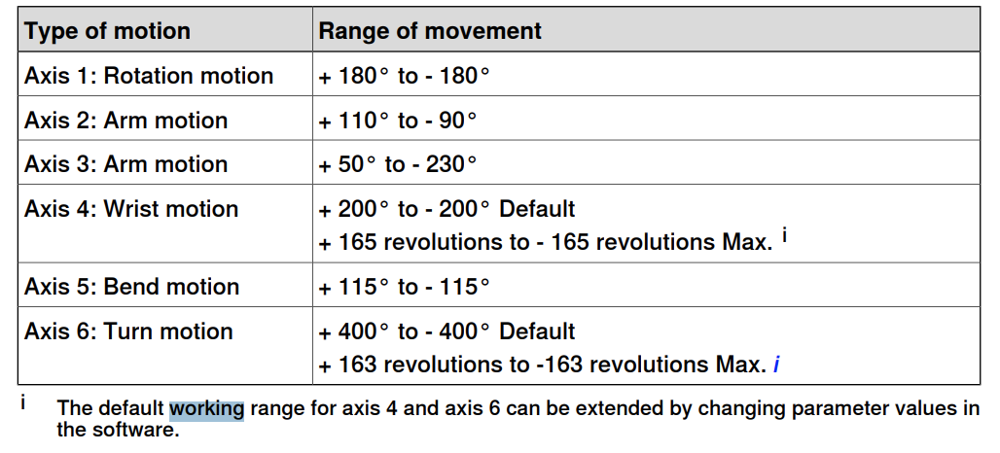

In [21]:
def check_invalid_trajectory(trajectory, center, radius):
  center_array = np.array(center)
  radius_squared = radius ** 2
  for point in trajectory:
      if np.sum((np.array(point) - center_array) ** 2) <= radius_squared:
          return True
  return False


def check_joint_range(trajectory, min_joints, max_joints):
  for point in trajectory:
    ibk = irb140_inverse_kinematics_arm(np.array(point))
    if (ibk[0] >= (max_joints[0] * np.pi/180))|(ibk[1] >= (max_joints[1] * np.pi/180))|(ibk[2] >= (max_joints[2] * np.pi/180)):
          return True
    #Descomentar estas dos lineas para movimientos cartesianos
    #Y en cod de rapid, confl y conj off, y singarea wrist (Comentar lock axis4)
    if (ibk[0] < (min_joints[0] * np.pi/180))|(ibk[1] < (min_joints[1] * np.pi/180))|(ibk[2] < (min_joints[2] * np.pi/180)):
          return True
  return False



def generar_angulos_validos(min_joints, max_joints, cantidad, thetas_correction):
    J_sym = symbolic_irb140_forward_kinematics()
    j_1 = []
    j_2 = []
    j_3 = []
    j_4 = []
    j_5 = []
    j_6 = []
    tcp_point = []

    id = 0
    while id < cantidad:
        thetas = np.array([random.uniform(min_joints[i], max_joints[i]) for i in range(6)]) * np.pi/180
        matrixes = irb140_forward_kinematics(J_sym, thetas + thetas_correction)
        tcp_point_actual = matrixes[-1, 0:3, 3]

        if id > 0:
            trajectory = define_line_3d(tcp_point[id-1], tcp_point_actual)
            if check_invalid_trajectory(trajectory, [70, 0, 352], 350):
               continue
            if check_joint_range(trajectory,min_joints[0:3], max_joints[0:3]):
                continue

        j_1.append(thetas[0] * 180/np.pi)
        j_2.append(thetas[1] * 180/np.pi)
        j_3.append(thetas[2] * 180/np.pi)
        j_4.append(thetas[3] * 180/np.pi)
        j_5.append(thetas[4] * 180/np.pi)
        j_6.append(thetas[5] * 180/np.pi)
        tcp_point.append(tcp_point_actual)
        id += 1

    return j_1, j_2, j_3, j_4, j_5, j_6

In [22]:
min_joints = [0, -12, -90, 0, 0, 0]
min_joints[0:3]

[0, -12, -90]

In [23]:
#len(j__1)
J_sym = symbolic_irb140_forward_kinematics()
thetas_p1 = np.array([57.168, 12.134, -82.731, 20.735, 74.071, 43.511]) * np.pi/180
thetas_p2 = np.array([75.240, 68.669, 30.014, 86.986, 25.097, 25.771]) * np.pi/180

tcp_point_p1 = irb140_forward_kinematics(J_sym, thetas_p1 + thetas_correction)[-1,0:3,3]
tcp_point_p2 = irb140_forward_kinematics(J_sym, thetas_p2 + thetas_correction)[-1,0:3,3]

trajectory = define_line_3d(tcp_point_p1, tcp_point_p2)

#question_valid = check_invalid_trajectory(trajectory, [70, 0, 352], 500)

question_valid = check_joint_range(trajectory,[0, -12, -90], [90, 110, 50])

question_valid
#J_sym
#[j__1[1],j__2[1],j__4[1],j__5[1],j__5[1],j__6[1]]

True

In [24]:
irb140_forward_kinematics(J_sym, thetas_p1 + thetas_correction)[-1,0:3,3] #array([171.6084395 , 136.84885328, 803.47491906])

array([ 147.42434718,  228.47746515, 1062.3751234 ])

In [25]:
tcp_point_p1

array([ 147.42434718,  228.47746515, 1062.3751234 ])

In [26]:
#El área esférica está centrada en (70, yc, 352) el radio es 254 (voy a tomar y=0 porque no tengo un valor exacto)
#Los puntos para definir la esfera son (314, y1, 421), (1, y2, 596), (218, y3, 558)

# Función para generar números aleatorios dentro de un rango y guardarlos en un archivo CSV
def generar_valores_IRB140(v_ranges, z_ranges, min_joints, max_joints, cantidad, thetas_correction, nombre_archivo):
    directorio = os.path.dirname(nombre_archivo)
    os.makedirs(directorio, exist_ok=True)
    
    if not os.path.isfile(nombre_archivo) or os.path.getsize(nombre_archivo) == 0:
        # Si el archivo no existe o está vacío, escribir las cabeceras CSV
        with open(nombre_archivo, 'w') as archivo:
            archivo.write('ID, Vel TCP, Pres, Theta_1, Theta_2, Theta_3, Theta_4, Theta_5, Theta_6\n')
    with open(nombre_archivo, 'a') as archivo:
        j_1_array, j_2_array, j_3_array, j_4_array, j_5_array, j_6_array = generar_angulos_validos(min_joints, max_joints, cantidad, thetas_correction)
        for i in range(cantidad):
            id = i
            vel = random.uniform(v_ranges[0], v_ranges[1])
            z = random.uniform(z_ranges[0], z_ranges[1])
            j_1 = j_1_array[i]
            j_2 = j_2_array[i]
            j_3 = j_3_array[i]
            j_4 = j_4_array[i]
            j_5 = j_5_array[i]
            j_6 = j_6_array[i]

            archivo.write(f'{id}, {vel}, {z}, {j_1}, {j_2}, {j_3}, {j_4}, {j_5}, {j_6}\n')


#Rangos de velocidad en mm/s
v_ranges = [10, 200]

#Rangos de presicion en mm
z_ranges = [10, 30]

# Cantidad de números aleatorios a generar
cantidad = 500
#cantidad = 500 #Con la verificación de que el punto se encuentre en el área positiva del primer cuadrante tarda más
#Para 100 tarda 2 mins y pico


fecha_actual = datetime.now().strftime("%Y-%m-%d")

calculate = False #True
not_limited = False

if calculate:
  if not_limited:
    #Rangos para cada joint -> Completos
    min_joints = [-180, -90, -230, -200, -115, -360]
    max_joints = [180, 110, 50, 200, 115, 360]

    # Nombre del archivo donde se guardarán los ángulos
    nombre_archivo = f'./Pruebas_Iniciales/datos_irb140_{fecha_actual}.csv'
  else:
    #Rangos para cada joint -> Limitados a robconf [0 0 0 0] siendo m incoginita pero m = 0 (z > 0 segun grafico IRB 140 Product Specification)
    min_joints = [0, -12, -90, 0, 0, 0]
    max_joints = [90, 110, 50, 90, 110, 90]

    # Nombre del archivo donde se guardarán los ángulos
    nombre_archivo = f'./Pruebas_Iniciales/datos_irb140_{fecha_actual}_LIMITED_cart.csv'


  # Llamada a la función para generar y guardar los ángulos
  generar_valores_IRB140(v_ranges, z_ranges, min_joints, max_joints, cantidad, thetas_correction, nombre_archivo)

  print(f'Se han añadido {cantidad} en el archivo "{nombre_archivo}".')


# **Filtro Discreto para agregar aceleraciones**
De acuerdo con el paper *Identification of robot forward dynamics via neural network*:

“The corresponding joint accelerations were retrieved through the application of an appropriate discrete filter to the joint velocities just collected.”

Entonces, se tomarán dos datos “de más” (muestra 0 y muestra 101) para permitir aplicar el filtro discreto a las n-2 muestras y tener información de velocidad. Se podrán estudiar otras técnicas para derivar las aceleraciones a partir de las velocidades.




In [27]:
def calcular_aceleraciones(vels, dt):
    """Calcula aceleración usando esquema de diferencias finitas centradas de 5 puntos."""
    acc = np.zeros_like(vels)
    n = len(vels)
    for i in range(2, n - 2):
        acc[i] = (-vels[i + 2] + 8 * vels[i + 1] - 8 * vels[i - 1] + vels[i - 2]) / (12 * dt)
    return acc

In [28]:
#files = ['50_50', '50_100', '100_10', '10_100', 'NN_NN_2', 'NN_NN_merged']
num_variables = 6 
files = ['50_50', '50_100', '100_10', '10_100', 'NN_NN_1', 'NN_NN_2', 'NN_NN_4', 'NN_NN_CUT_MERGED' ]
datos_IRB_140 = {}
datos_IRB_140_st = 'datos_IRB_140_'

tcps_vels = {}
tcps_accus = {}

j_poses = {}
j_vels = {}
j_accels = {}
j_torqs = {}
times = {}

tcp_vel = 'rand_v'
tcp_accu = 'rand_z'

j_pos = 'pos_j'
j_vel = 'vel_j'
j_accel = 'acc_j'
j_torq = 'torq_j'

time_interval = 0.01

for file in range(0,len(files)):
  #print(files[file])
  variable_name = datos_IRB_140_st + files[file] #str(file)
  datos_IRB_140[variable_name] = pd.read_csv(f'./IRB_140/RBSTDIO/DATA/Output_{files[file]}.csv',delimiter=',', encoding="utf-8", skipinitialspace=True)
  #print(datos_IRB_140[variable_name].head())
  print(files[file])
  time_var = f"{files[file]}_time"
  times[time_var] = datos_IRB_140[variable_name].iloc[:, 0].values  # Primera columna = tiempo


  tcps_vels_name = str(files[file]) + '_' + tcp_vel
  tcps_vels[tcps_vels_name] = datos_IRB_140[variable_name].iloc[1:-1,3].values
  tcps_accus_name = str(files[file]) + '_' + tcp_accu
  tcps_accus[tcps_accus_name] = datos_IRB_140[variable_name].iloc[1:-1,4].values

  for i in range(1, num_variables + 1):
    pos_j_name = str(files[file]) + '_' + j_pos + str(i)
    j_poses[pos_j_name] = datos_IRB_140[variable_name].iloc[:,4+i].values #* (np.pi / 180.0)

    vel_j_name = str(files[file]) + '_' + j_vel + str(i)
    j_vels[vel_j_name] = datos_IRB_140[variable_name].iloc[:,10+i].values #* (np.pi / 180.0)

    torq_j_name = str(files[file]) + '_' + j_torq + str(i)
    j_torqs[torq_j_name] = datos_IRB_140[variable_name].iloc[:,16+i].values 


    acc_j_name = str(files[file]) + '_' + j_accel + str(i)
    j_accels[acc_j_name]= calcular_aceleraciones(j_vels[vel_j_name], time_interval) #* (np.pi / 180.0) #https://en.wikipedia.org/wiki/Five-point_stencil https://web.media.mit.edu/~crtaylor/calculator.html


50_50
50_100
100_10
10_100
NN_NN_1
NN_NN_2
NN_NN_4
NN_NN_CUT_MERGED


In [29]:
tcps_vels['NN_NN_1_rand_v']
tcps_accus['NN_NN_1_rand_z']

j_poses['NN_NN_1_pos_j1']
j_poses['NN_NN_1_pos_j2']
j_poses['NN_NN_1_pos_j3']
j_poses['NN_NN_1_pos_j4']
j_poses['NN_NN_1_pos_j5']
j_poses['NN_NN_1_pos_j6']

j_vels['NN_NN_1_vel_j1']
j_vels['NN_NN_1_vel_j2']
j_vels['NN_NN_1_vel_j3']
j_vels['NN_NN_1_vel_j4']
j_vels['NN_NN_1_vel_j5']
j_vels['NN_NN_1_vel_j6']

j_torqs['NN_NN_1_torq_j1']
j_torqs['NN_NN_1_torq_j2']
j_torqs['NN_NN_1_torq_j3']
j_torqs['NN_NN_1_torq_j4']
j_torqs['NN_NN_1_torq_j5']
j_torqs['NN_NN_1_torq_j6']

j_accels['NN_NN_1_acc_j1']
j_accels['NN_NN_1_acc_j2']
j_accels['NN_NN_1_acc_j3']
j_accels['NN_NN_1_acc_j4']
j_accels['NN_NN_1_acc_j5']
j_accels['NN_NN_1_acc_j6']

array([0.        , 0.        , 2.41269167, ..., 0.01645833, 0.        ,
       0.        ])

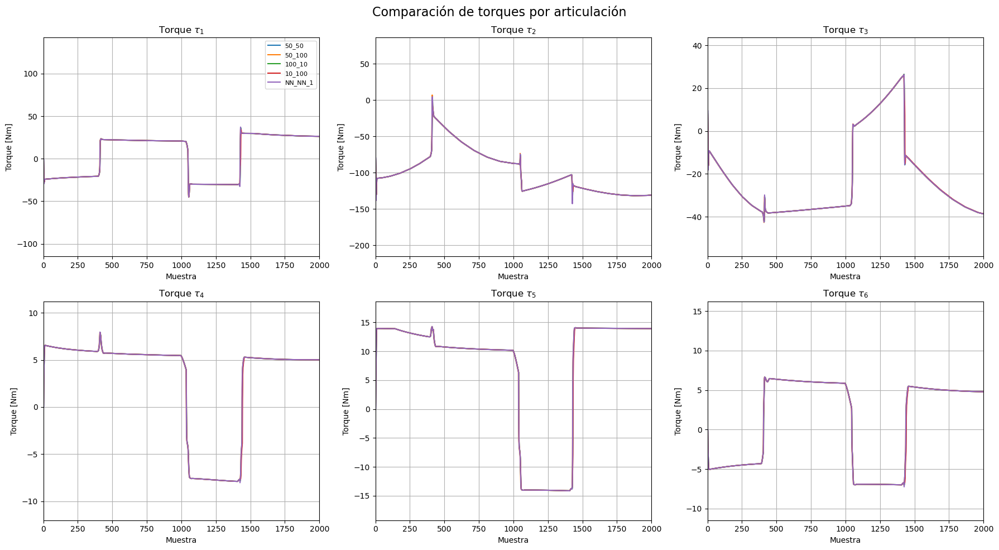

In [30]:
plt.figure(figsize=(18, 10))  # ancho x alto

for j in range(1, 7):  # τ₁ a τ₆
    plt.subplot(2, 3, j)  # 2 filas, 3 columnas, Valocidad j
    for file in files[:-3]:
        item = f"{file}_{j_torq}{j}"
        if item in j_torqs:
            plt.plot(j_torqs[item], label=file)
    plt.title(rf'Torque $\tau_{{{j}}}$')
    plt.ylabel('Torque [Nm]')
    plt.xlabel('Muestra')
    plt.xlim([0, 2000])
    plt.grid(True)
    if j == 1:
        plt.legend(loc='upper right', fontsize=8)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
plt.suptitle('Comparación de torques por articulación', fontsize=16)
plt.show()


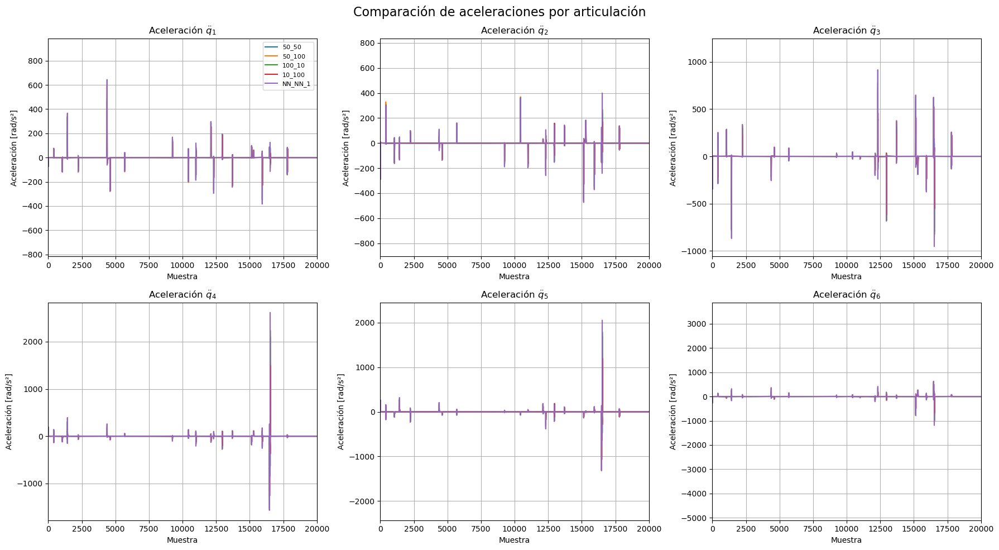

In [31]:
plt.figure(figsize=(18, 10))  # ancho x alto

for j in range(1, 7):  # q̈₁ a q̈₆
    plt.subplot(2, 3, j)  # 2 filas, 3 columnas, Valocidad j
    for file in files[:-3]:
        item = f"{file}_{j_accel}{j}"
        if item in j_accels:
            plt.plot(j_accels[item], label=file)
    plt.title(rf'Aceleración $\ddot{{q}}_{{{j}}}$')
    plt.ylabel('Aceleración [rad/s²]')
    plt.xlabel('Muestra')
    plt.xlim([0, 20000])
    plt.grid(True)
    if j == 1:
        plt.legend(loc='upper right', fontsize=8)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
plt.suptitle('Comparación de aceleraciones por articulación', fontsize=16)
plt.show()


In [32]:
files = ['linear_NN_NN', 'linear_NN_NN_2', 'linear_NN_NN_3']

time_interval = 0.01


for file in range(0,len(files)):
  #print(files[file])
  variable_name = datos_IRB_140_st + files[file] #str(file)
  datos_IRB_140[variable_name] = pd.read_csv(f'./IRB_140/RBSTDIO/DATA/Output_{files[file]}.csv',delimiter=',', encoding="utf-8", skipinitialspace=True)
  #print(datos_IRB_140[variable_name].head())
  print(files[file])
  time_var = f"{files[file]}_time"
  times[time_var] = datos_IRB_140[variable_name].iloc[:, 0].values  # Primera columna = tiempo


  tcps_vels_name = str(files[file]) + '_' + tcp_vel
  tcps_vels[tcps_vels_name] = datos_IRB_140[variable_name].iloc[1:-1,3].values
  tcps_accus_name = str(files[file]) + '_' + tcp_accu
  tcps_accus[tcps_accus_name] = datos_IRB_140[variable_name].iloc[1:-1,4].values

  for i in range(1, num_variables + 1):
    pos_j_name = str(files[file]) + '_' + j_pos + str(i)
    j_poses[pos_j_name] = datos_IRB_140[variable_name].iloc[:,4+i].values 

    vel_j_name = str(files[file]) + '_' + j_vel + str(i)
    j_vels[vel_j_name] = datos_IRB_140[variable_name].iloc[:,10+i].values 

    torq_j_name = str(files[file]) + '_' + j_torq + str(i)
    j_torqs[torq_j_name] = datos_IRB_140[variable_name].iloc[:,16+i].values 

    acc_j_name = str(files[file]) + '_' + j_accel + str(i)
    j_accels[acc_j_name]= calcular_aceleraciones(j_vels[vel_j_name], time_interval)  #https://en.wikipedia.org/wiki/Five-point_stencil https://web.media.mit.edu/~crtaylor/calculator.html

linear_NN_NN
linear_NN_NN_2
linear_NN_NN_3


In [33]:
tcps_vels['linear_NN_NN_rand_v']
tcps_accus['linear_NN_NN_rand_z']

j_poses['linear_NN_NN_pos_j1']
j_poses['linear_NN_NN_pos_j2']
j_poses['linear_NN_NN_pos_j3']
j_poses['linear_NN_NN_pos_j4']
j_poses['linear_NN_NN_pos_j5']
j_poses['linear_NN_NN_pos_j6']

j_vels['linear_NN_NN_vel_j1']
j_vels['linear_NN_NN_vel_j2']
j_vels['linear_NN_NN_vel_j3']
j_vels['linear_NN_NN_vel_j4']
j_vels['linear_NN_NN_vel_j5']
j_vels['linear_NN_NN_vel_j6']

j_torqs['linear_NN_NN_torq_j1']
j_torqs['linear_NN_NN_torq_j2']
j_torqs['linear_NN_NN_torq_j3']
j_torqs['linear_NN_NN_torq_j4']
j_torqs['linear_NN_NN_torq_j5']
j_torqs['linear_NN_NN_torq_j6']

j_accels['linear_NN_NN_acc_j1']
j_accels['linear_NN_NN_acc_j2']
j_accels['linear_NN_NN_acc_j3']
j_accels['linear_NN_NN_acc_j4']
j_accels['linear_NN_NN_acc_j5']
j_accels['linear_NN_NN_acc_j6']

array([ 0.00000000e+00,  0.00000000e+00, -8.38554550e+00, ...,
       -2.96059473e-14,  0.00000000e+00,  0.00000000e+00])

# **PROBLEMA DINAMICO DIRECTO**:

In [34]:
import math
import numpy as np
import keras 
import tensorflow as tf
import datetime
import json
import os
#from tensorflow import keras
from keras.models import Sequential #One of the most important classes in tensorflow, used to creare NN (Named after NN as a sequence of layers)
from keras.layers import Input, Dense, LSTM, BatchNormalization, Dropout, InputLayer #Dense layer means that one neuron in one layer is connected to all neurons in the next layer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from keras.regularizers import l2, l1, l1_l2
from sklearn.utils import shuffle
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from scipy.interpolate import CubicSpline
from scipy.ndimage import gaussian_filter1d
#from keras_tuner import RandomSearch
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [35]:
#linear_002
#j_poses['linear_002_test_10_100_pos_j1'].shape
#j_vels['linear_002_test_10_100_vel_j1'].shape
#j_accels['linear_002_test_10_100_acc_j1'].shape
#j_torqs['linear_002_test_10_100_torq_j1'][1:-1].shape

In [36]:
#Inputs ---> uk=[qTk-1  d_qTk-1  tauTk]T
time_joint= times['NN_NN_CUT_MERGED_time'][0:-2]

pos_j1 = j_poses['NN_NN_CUT_MERGED_pos_j1'][0:-2]  #34440 -> 34438, k
pos_j2 = j_poses['NN_NN_CUT_MERGED_pos_j2'][0:-2]
pos_j3 = j_poses['NN_NN_CUT_MERGED_pos_j3'][0:-2] 
pos_j4 = j_poses['NN_NN_CUT_MERGED_pos_j4'][0:-2] 
pos_j5 = j_poses['NN_NN_CUT_MERGED_pos_j5'][0:-2] 
pos_j6 = j_poses['NN_NN_CUT_MERGED_pos_j6'][0:-2] 

vels_j1 = j_vels['NN_NN_CUT_MERGED_vel_j1'][1:-1]  #34440 -> 34438 k
vels_j2 = j_vels['NN_NN_CUT_MERGED_vel_j2'][1:-1] 
vels_j3 = j_vels['NN_NN_CUT_MERGED_vel_j3'][1:-1] 
vels_j4 = j_vels['NN_NN_CUT_MERGED_vel_j4'][1:-1] 
vels_j5 = j_vels['NN_NN_CUT_MERGED_vel_j5'][1:-1] 
vels_j6 = j_vels['NN_NN_CUT_MERGED_vel_j6'][1:-1] 

torq_j1 = j_torqs['NN_NN_CUT_MERGED_torq_j1'][1:-1]  #34440 -> 34438 k
torq_j2 = j_torqs['NN_NN_CUT_MERGED_torq_j2'][1:-1] 
torq_j3 = j_torqs['NN_NN_CUT_MERGED_torq_j3'][1:-1] 
torq_j4 = j_torqs['NN_NN_CUT_MERGED_torq_j4'][1:-1] 
torq_j5 = j_torqs['NN_NN_CUT_MERGED_torq_j5'][1:-1] 
torq_j6 = j_torqs['NN_NN_CUT_MERGED_torq_j6'][1:-1] 

#Outputs
accs_j1 = j_accels['NN_NN_CUT_MERGED_acc_j1']  #34438 k
accs_j2 = j_accels['NN_NN_CUT_MERGED_acc_j2'] 
accs_j3 = j_accels['NN_NN_CUT_MERGED_acc_j3'] 
accs_j4 = j_accels['NN_NN_CUT_MERGED_acc_j4'] 
accs_j5 = j_accels['NN_NN_CUT_MERGED_acc_j5'] 
accs_j6 = j_accels['NN_NN_CUT_MERGED_acc_j6'] 


pos_next_j1 = j_poses['NN_NN_CUT_MERGED_pos_j1'][1:-1]  #34440 -> 34438, k
pos_next_j2 = j_poses['NN_NN_CUT_MERGED_pos_j2'][1:-1] 
pos_next_j3 = j_poses['NN_NN_CUT_MERGED_pos_j3'][1:-1] 
pos_next_j4 = j_poses['NN_NN_CUT_MERGED_pos_j4'][1:-1] 
pos_next_j5 = j_poses['NN_NN_CUT_MERGED_pos_j5'][1:-1] 
pos_next_j6 = j_poses['NN_NN_CUT_MERGED_pos_j6'][1:-1] 

/var/folders/fh/g4nwx4rn28g_fjncv9fq4dyr0000gn/T/ipykernel_18453/942751189.py:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize=10)


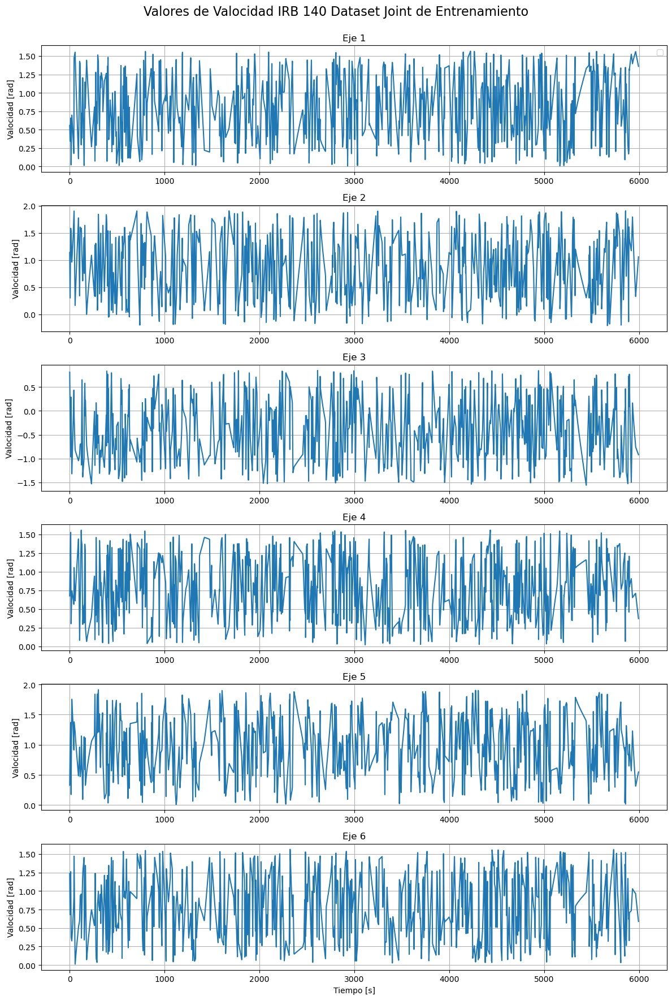

In [37]:
num_links = 6
plt.figure(figsize=(12, 18))
for i in range(num_links):
    plt.subplot(num_links, 1, i+1)
    plt.plot(time_joint, pos_j1 * (np.pi/180.0) if i == 0 else
                        pos_j2 * (np.pi/180.0) if i == 1 else
                        pos_j3 * (np.pi/180.0) if i == 2 else
                        pos_j4 * (np.pi/180.0) if i == 3 else
                        pos_j5 * (np.pi/180.0) if i == 4 else
                        pos_j6 * (np.pi/180.0))
    plt.ylabel('Valocidad [rad]')
    plt.title(f'Eje {i+1}')
    plt.grid(True)
    #plt.xlim([1900, 2200])
    if i == 0:
        plt.legend(loc='upper right', fontsize=10)
plt.xlabel('Tiempo [s]')
#plt.tight_layout() 
plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
plt.suptitle('Valores de Valocidad IRB 140 Dataset Joint de Entrenamiento', fontsize=16)
plt.show()

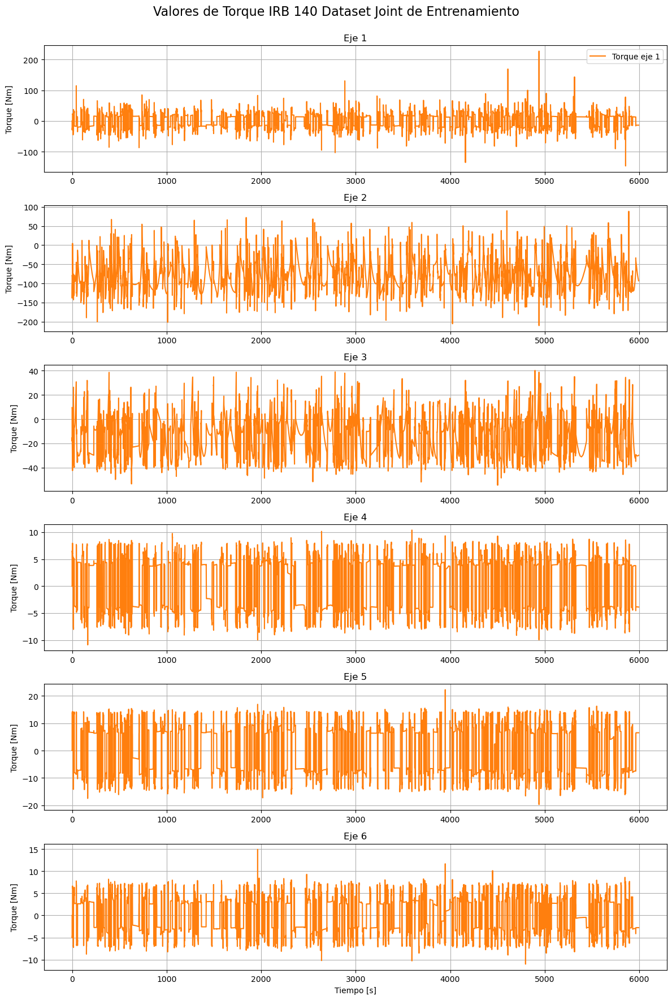

In [38]:
num_links = 6
plt.figure(figsize=(12, 18))

# Definir color naranja en hexadecimal
orange = '#ff7f0e'

for i in range(num_links):
    plt.subplot(num_links, 1, i+1)
    plt.plot(time_joint, 
             torq_j1 if i == 0 else
             torq_j2 if i == 1 else
             torq_j3 if i == 2 else
             torq_j4 if i == 3 else
             torq_j5 if i == 4 else
             torq_j6,
             color=orange,
             label=f'Torque eje {i+1}')
    
    plt.ylabel('Torque [Nm]')
    plt.title(f'Eje {i+1}')
    plt.grid(True)
    # plt.xlim([1900, 2200])  # opcional para zoom

    if i == 0:
        plt.legend(loc='upper right', fontsize=10)

plt.xlabel('Tiempo [s]')
plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
plt.suptitle('Valores de Torque IRB 140 Dataset Joint de Entrenamiento', fontsize=16)
plt.show()


In [39]:
#inputs = np.vstack((pos_j1, pos_j2, pos_j3, pos_j4, pos_j5, pos_j6, vels_j1, vels_j2, vels_j3, vels_j4, vels_j5, vels_j6, torq_j1, torq_j2, torq_j3, torq_j4, torq_j5, torq_j6)).T
inputs = np.vstack((pos_j1, pos_j2, pos_j3, pos_j4, pos_j5, pos_j6, torq_j1, torq_j2, torq_j3, torq_j4, torq_j5, torq_j6)).T
#Aca dudo si es mejor calcular todos los outputs de una, o de a uno
#outputs = np.vstack((accs_j1, accs_j2, accs_j3, accs_j4, accs_j5, accs_j6)).T
outputs = np.vstack((pos_next_j1,pos_next_j2,pos_next_j3,pos_next_j4,pos_next_j5,pos_next_j6)).T

In [40]:
inputs.shape

(599363, 12)

In [41]:
outputs.shape

(599363, 6)

# Red neuronal LSTM

In [42]:
#inputs = np.vstack((pos_j1, pos_j2, pos_j3, pos_j4, pos_j5, pos_j6, vels_j1, vels_j2, vels_j3, vels_j4, vels_j5, vels_j6, torq_j1, torq_j2, torq_j3, torq_j4, torq_j5, torq_j6)).T
inputs = np.vstack((pos_j1, pos_j2, pos_j3, pos_j4, pos_j5, pos_j6, torq_j1, torq_j2, torq_j3, torq_j4, torq_j5, torq_j6)).T
#outputs = np.vstack((accs_j1, accs_j2, accs_j3, accs_j4, accs_j5, accs_j6)).T
outputs = np.vstack((pos_next_j1,pos_next_j2,pos_next_j3,pos_next_j4,pos_next_j5,pos_next_j6)).T

In [43]:
def create_lstm_sequences(inputs, outputs, time_joint, window_size=6, split_train=0.7, split_val=0.15):
    """
    Genera secuencias de entrada y salida para una LSTM, dividiendo el dataset en entrenamiento, validación y test.

    Args:
        inputs (np.ndarray): Matriz (N, F_in) de entradas (posiciones, velocidades, aceleraciones).
        outputs (np.ndarray): Matriz (N, F_out) de salidas (torques).
        time_joint (np.ndarray): Vector (N,) de tiempo asociado a los datos.
        window_size (int): Tamaño de la ventana de tiempo para la LSTM.
        split_train (float): Proporción para el conjunto de entrenamiento (ej: 0.7).
        split_val (float): Proporción para validación (ej: 0.15). El resto se usará para test.

    Returns:
        X_train, Y_train: Datos de entrenamiento.
        X_val, Y_val: Datos de validación.
        X_test, Y_test: Datos de prueba.
        t_val, t_test: Tiempos asociados a Y_val y Y_test.
    """
    assert 0 < split_train < 1, "split_train debe estar entre 0 y 1"
    assert 0 <= split_val < 1, "split_val debe estar entre 0 y 1"
    assert split_train + split_val < 1, "La suma split_train + split_val debe ser menor que 1"

    # Construcción de ventanas
    input_sequences = []
    output_sequences = []
    time_targets = []

    for i in range(len(inputs) - window_size):
        input_sequences.append(inputs[i:i + window_size])
        output_sequences.append(outputs[i + window_size])
        time_targets.append(time_joint[i + window_size])

    X = np.array(input_sequences)
    Y = np.array(output_sequences)
    T = np.array(time_targets)

    # Índices de corte
    n_total = len(X)
    idx_train = int(split_train * n_total)
    idx_val = int((split_train + split_val) * n_total)

    # División de datos
    X_train, Y_train = X[:idx_train], Y[:idx_train]
    X_val, Y_val = X[idx_train:idx_val], Y[idx_train:idx_val]
    X_test, Y_test = X[idx_val:], Y[idx_val:]

    t_val = T[idx_train:idx_val]
    t_test = T[idx_val:]

    return X_train, Y_train, X_val, Y_val, X_test, Y_test, t_val, t_test


In [44]:
w_size=50
# Aplicar MinMaxScaler
scaler1_LSTM = StandardScaler() #MinMaxScaler()#feature_range=(0, 1)) #RobustScaler() #MinMaxScaler() #MinMaxScaler()
inputs = scaler1_LSTM.fit_transform(inputs)

scaler2_LSTM = StandardScaler() #MinMaxScaler()#feature_range=(0, 1)) #RobustScaler() #MinMaxScaler() #MinMaxScaler()
outputs = scaler2_LSTM.fit_transform(outputs)

X_train_LSTM, y_train_LSTM, X_val_LSTM, y_val_LSTM, X_test_LSTM, y_test_LSTM, t_val_LSTM, t_test_LSTM = create_lstm_sequences(
    inputs, outputs, time_joint,
    window_size=w_size,
    split_train=0.8,
    split_val=0.1
)

In [45]:
#_60_bs128_ws50_1em4

In [46]:
inputs.shape

(599363, 12)

In [47]:
X_train_LSTM.shape

(479450, 50, 12)

In [48]:
np.max(inputs)

10.627494063132701

In [49]:
print(X_train_LSTM.dtype, y_train_LSTM.dtype)
print(np.nanmean(X_train_LSTM))


float64 float64
-0.014898712335644007


🔄 Cargando modelo LSTM existente...


/Users/melinagabrielacheminet/miniforge3/lib/python3.12/site-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 12 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 40)             │         8,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 6)              │           246 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,180 (204.53 KB)

 Trainable params: 8,726 (68.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,454 (136.36 KB)

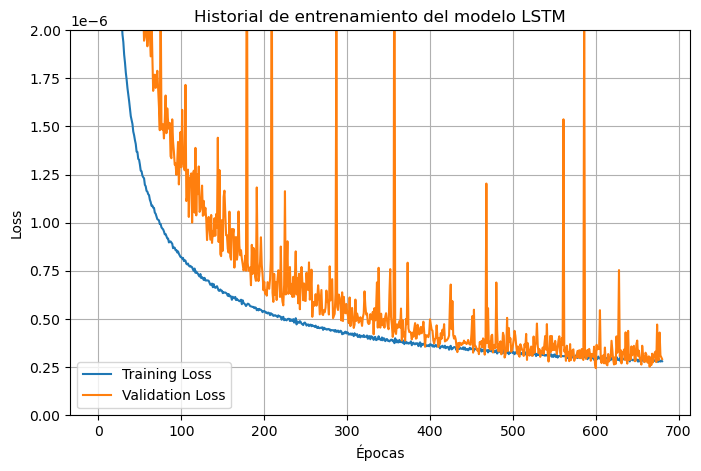

✅ Modelo LSTM listo para usar.


In [50]:
# Verificar si el modelo ya existe

LSTM_model_path = "./IRB_140/DD_NN_Pos/Modelos_NN/LSTM/LSTM_nn_Best_Model.keras"
LSTM_history_path = "./IRB_140/DD_NN_Pos/Modelos_NN/LSTM/lstm_best_history.json"

if os.path.exists(LSTM_model_path):
    print("🔄 Cargando modelo LSTM existente...")
    LSTM_network = keras.models.load_model(LSTM_model_path)
    LSTM_network.summary()

    if os.path.exists(LSTM_history_path):

        with open(LSTM_history_path, "r") as f:
            LSTM_history = json.load(f)  # Load the history data as a dictionary
        # Create a dummy History object for plotting:
        #LSTM_history = type('DummyHistory', (object,), {'history': LSTM_history_dict})()

        # Graficar el history
        plt.figure(figsize=(8, 5))
        plt.plot(LSTM_history["loss"], label="Training Loss")
        plt.plot(LSTM_history["val_loss"], label="Validation Loss")
        plt.legend()
        plt.xlabel("Épocas")
        plt.ylabel("Loss")
        plt.grid(True)
        plt.gca().set_ylim(0, 2e-6)
        plt.title("Historial de entrenamiento del modelo LSTM")
        plt.show()
    else:
        print("⚠️ No se encontró el archivo de history.")
else:
    print("⚙️ Creando nuevo modelo...")
    LSTM_network = Sequential() #Sequential([Input(shape=(w_size, X_train_LSTM.shape[2]))])
    LSTM_network.add(LSTM(40, activation='tanh', input_shape=(w_size, X_train_LSTM.shape[2])))
    
    #LSTM_network.add(LSTM(16, activation='tanh', input_shape=(w_size, X_train_LSTM.shape[2]), 
    #            return_sequences=True))
    #LSTM_network.add(LSTM(2, activation='tanh',
    #                return_sequences=True, kernel_regularizer=l2(0)))
    #LSTM_network.add(LSTM(16, activation='tanh'))
    LSTM_network.add(Dense(y_train_LSTM.shape[1]))
    LSTM_network.compile(loss = 'mean_squared_error', optimizer=keras.optimizers.Adam(1e-4), metrics = ['mae']) #learning_rate=1e-5
    #mean_sqared_error
    LSTM_network.summary()


    #LSTM_checkpoint_cb = keras.callbacks.ModelCheckpoint("/content/drive/MyDrive/CT_p/Modelos_NN/LINEAR/LSTM_nn_Best_Model.h5", save_best_only=True)
    LSTM_checkpoint_cb = keras.callbacks.ModelCheckpoint(LSTM_model_path,save_best_only=True)
    LSTM_early_stopping_cb = keras.callbacks.EarlyStopping(monitor='val_loss', 
                                                           patience=80, min_delta=1E-10, 
                                                           restore_best_weights=True)

    LSTM_history = LSTM_network.fit(X_train_LSTM, y_train_LSTM, epochs=700, 
                                    batch_size=128, validation_data=(X_val_LSTM, y_val_LSTM), 
                                    callbacks=[LSTM_checkpoint_cb, LSTM_early_stopping_cb])
    
    with open(LSTM_history_path, "w") as f:
        json.dump(LSTM_history.history, f)
    with open(LSTM_history_path, "r") as f:
        LSTM_history = json.load(f)  # Load the history data as a dictionary

    # Create a dummy History object for plotting:
    #LSTM_history = type('DummyHistory', (object,), {'history': LSTM_history_dict})()

    pd.DataFrame(LSTM_history).plot(figsize=(8, 5))
    plt.grid(True)
    #plt.gca().set_xlim(0, 1)
    plt.gca().set_ylim(0, 2e-6)
    plt.show()

print("✅ Modelo LSTM listo para usar.")

In [51]:
LSTM_accuracy_test = LSTM_network.evaluate(X_test_LSTM, y_test_LSTM)

1873/1873 ━━━━━━━━━━━━━━━━━━━━ 17s 9ms/step - loss: 1.8244e-07


In [52]:
LSTM_predictions = LSTM_network.predict(X_test_LSTM)

1873/1873 ━━━━━━━━━━━━━━━━━━━━ 14s 7ms/step


In [53]:
LSTM_predictions[0]

array([ 0.7507781 , -0.44001432, -0.79484517,  0.90849942,  1.32489364,
        0.31433881])

In [54]:
y_test_LSTM[0]

array([ 0.75048915, -0.44028268, -0.79511354,  0.90836846,  1.32503731,
        0.31442441])

*   [tf.keras.layers.LSTM](https://www.tensorflow.org/api_docs/python/tf/keras/layers/LSTM)



# Verificación de métricas y validación con nuevo dataset

In [55]:
#Inputs ---> uk=[qTk-1  d_qTk-1  tauTk]T
time_joint_N= times['NN_NN_4_time'][0:-2]

pos_j1_N = j_poses['NN_NN_4_pos_j1'][0:-2]  #34440 -> 34438, k
pos_j2_N = j_poses['NN_NN_4_pos_j2'][0:-2]
pos_j3_N = j_poses['NN_NN_4_pos_j3'][0:-2] 
pos_j4_N = j_poses['NN_NN_4_pos_j4'][0:-2] 
pos_j5_N = j_poses['NN_NN_4_pos_j5'][0:-2] 
pos_j6_N = j_poses['NN_NN_4_pos_j6'][0:-2] 

vels_j1_N = j_vels['NN_NN_4_vel_j1'][1:-1]  #34440 -> 34438 k
vels_j2_N = j_vels['NN_NN_4_vel_j2'][1:-1] 
vels_j3_N = j_vels['NN_NN_4_vel_j3'][1:-1] 
vels_j4_N = j_vels['NN_NN_4_vel_j4'][1:-1] 
vels_j5_N = j_vels['NN_NN_4_vel_j5'][1:-1] 
vels_j6_N = j_vels['NN_NN_4_vel_j6'][1:-1] 

torq_j1_N = j_torqs['NN_NN_4_torq_j1'][1:-1]  #34440 -> 34438 k
torq_j2_N = j_torqs['NN_NN_4_torq_j2'][1:-1] 
torq_j3_N = j_torqs['NN_NN_4_torq_j3'][1:-1] 
torq_j4_N = j_torqs['NN_NN_4_torq_j4'][1:-1] 
torq_j5_N = j_torqs['NN_NN_4_torq_j5'][1:-1] 
torq_j6_N = j_torqs['NN_NN_4_torq_j6'][1:-1] 

#Outputs
accs_j1_N = j_accels['NN_NN_4_acc_j1']  #34438 k
accs_j2_N = j_accels['NN_NN_4_acc_j2'] 
accs_j3_N = j_accels['NN_NN_4_acc_j3'] 
accs_j4_N = j_accels['NN_NN_4_acc_j4'] 
accs_j5_N = j_accels['NN_NN_4_acc_j5'] 
accs_j6_N = j_accels['NN_NN_4_acc_j6'] 


pos_next_j1_N = j_poses['NN_NN_4_pos_j1'][1:-1]  #34440 -> 34438, k
pos_next_j2_N = j_poses['NN_NN_4_pos_j2'][1:-1] 
pos_next_j3_N = j_poses['NN_NN_4_pos_j3'][1:-1] 
pos_next_j4_N = j_poses['NN_NN_4_pos_j4'][1:-1] 
pos_next_j5_N = j_poses['NN_NN_4_pos_j5'][1:-1] 
pos_next_j6_N = j_poses['NN_NN_4_pos_j6'][1:-1] 

/var/folders/fh/g4nwx4rn28g_fjncv9fq4dyr0000gn/T/ipykernel_18453/99488021.py:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize=10)


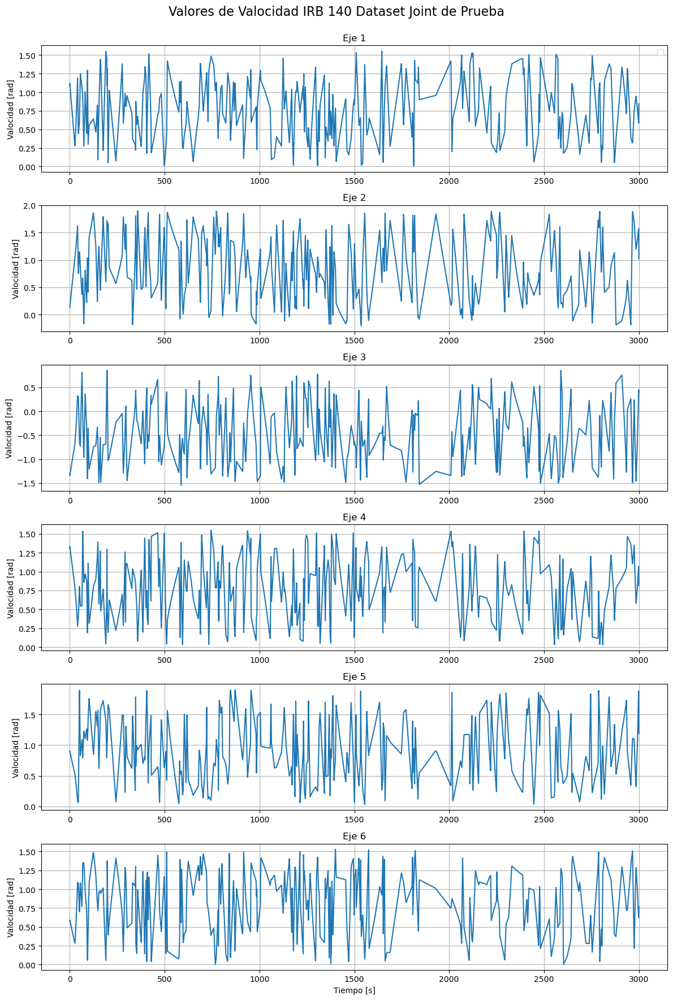

In [56]:
num_links = 6
plt.figure(figsize=(12, 18))
for i in range(num_links):
    plt.subplot(num_links, 1, i+1)
    plt.plot(time_joint_N, pos_j1_N * (np.pi/180.0) if i == 0 else
                        pos_j2_N * (np.pi/180.0) if i == 1 else
                        pos_j3_N * (np.pi/180.0) if i == 2 else
                        pos_j4_N * (np.pi/180.0) if i == 3 else
                        pos_j5_N * (np.pi/180.0) if i == 4 else
                        pos_j6_N * (np.pi/180.0))
    plt.ylabel('Valocidad [rad]')
    plt.title(f'Eje {i+1}')
    plt.grid(True)
    #plt.xlim([1900, 2200])
    if i == 0:
        plt.legend(loc='upper right', fontsize=10)
plt.xlabel('Tiempo [s]')
#plt.tight_layout() 
plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
plt.suptitle('Valores de Valocidad IRB 140 Dataset Joint de Prueba', fontsize=16)
plt.show()

/var/folders/fh/g4nwx4rn28g_fjncv9fq4dyr0000gn/T/ipykernel_18453/860936480.py:24: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize=10)


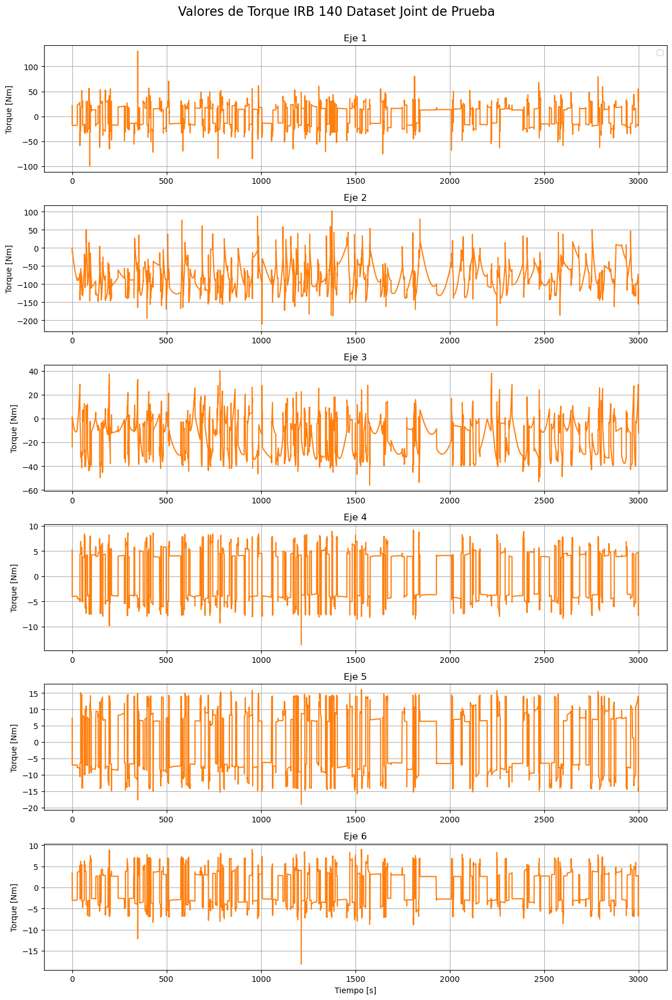

In [57]:
num_links = 6
plt.figure(figsize=(12, 18))

# Definir color naranja en hexadecimal
orange = '#ff7f0e'

for i in range(num_links):
    plt.subplot(num_links, 1, i+1)
    plt.plot(time_joint_N, 
             torq_j1_N if i == 0 else
             torq_j2_N if i == 1 else
             torq_j3_N if i == 2 else
             torq_j4_N if i == 3 else
             torq_j5_N if i == 4 else
             torq_j6_N,
             color=orange)
    
    plt.ylabel('Torque [Nm]')
    plt.title(f'Eje {i+1}')
    plt.grid(True)
    # plt.xlim([1900, 2200])  # opcional para zoom

    if i == 0:
        plt.legend(loc='upper right', fontsize=10)

plt.xlabel('Tiempo [s]')
plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
plt.suptitle('Valores de Torque IRB 140 Dataset Joint de Prueba', fontsize=16)
plt.show()


In [58]:
inputs_NEW = np.vstack((pos_j1_N, pos_j2_N, pos_j3_N, pos_j4_N, pos_j5_N, pos_j6_N, torq_j1_N, torq_j2_N, torq_j3_N, torq_j4_N, torq_j5_N, torq_j6_N)).T
outputs_NEW = np.vstack((pos_next_j1_N,pos_next_j2_N,pos_next_j3_N,pos_next_j4_N,pos_next_j5_N,pos_next_j6_N)).T

#inputs_NEW = np.vstack((pos_j1, pos_j2, pos_j3, pos_j4, pos_j5, pos_j6, torq_j1, torq_j2, torq_j3, torq_j4, torq_j5, torq_j6)).T
#outputs_NEW = np.vstack((pos_next_j1,pos_next_j2,pos_next_j3,pos_next_j4,pos_next_j5,pos_next_j6)).T
#time_joint_N = time_joint

In [59]:
def create_sequences_with_time(data, time, window_size= w_size):
    sequences = []
    times = []
    
    for i in range(len(data) - window_size):
        sequence = data[i:i + window_size]
        sequences.append(sequence)
        
        # Alinear con el tiempo del último dato de la ventana
        time_point = time[i + window_size - 1]
        times.append(time_point)
    
    return np.array(sequences), np.array(times)

X_test_scaled_LSTM = scaler1_LSTM.transform(inputs_NEW)
X_test_windowed_LSTM, t_ref_LSTM = create_sequences_with_time(X_test_scaled_LSTM, time_joint_N)
q_sim_LSTM = scaler2_LSTM.inverse_transform(LSTM_network.predict(X_test_windowed_LSTM))

9374/9374 ━━━━━━━━━━━━━━━━━━━━ 85s 9ms/step


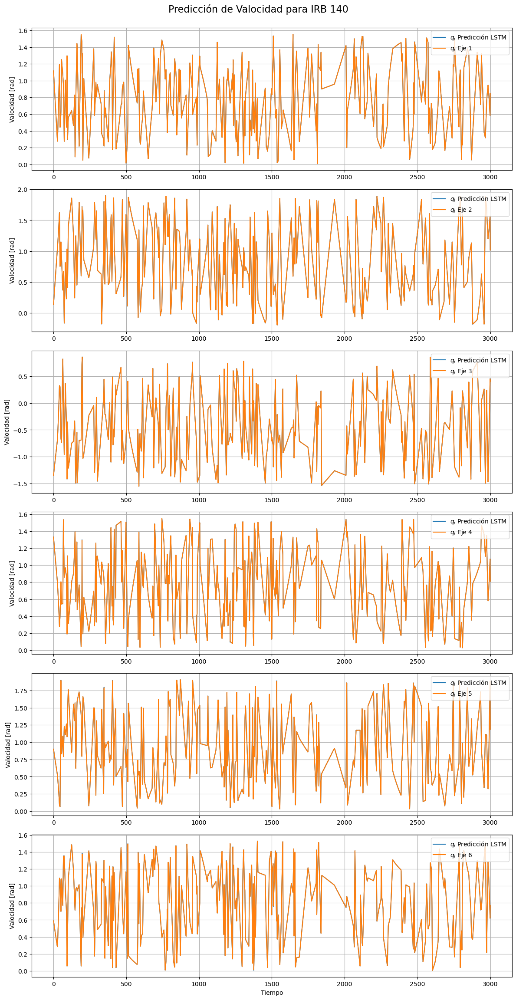

In [60]:
num_links = 6
t_ref = time_joint
# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Predicción de Valocidad para IRB 140", fontsize=16, y=0.95)

# Grafico los resultados
for i in range(num_links):
  plt.subplot(num_links, 1, i+1)
  #plt.plot(time_joint_N,outputs_NEW[:,i] * (np.pi/180.0), label=r"$q_{i}$ " f'Eje {i+1}')
  plt.plot(t_ref_LSTM,q_sim_LSTM[:,i] *(np.pi/180.0), label=r"$q_{i}$ Predicción LSTM")
  plt.plot(t_ref_LSTM,outputs_NEW[w_size:,i] *(np.pi/180.0), label=r"$q_{i}$ " f'Eje {i+1}')
  plt.ylabel('Valocidad [rad]')
  plt.legend(loc='upper right', fontsize=10)
  plt.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.xlabel('Tiempo');
plt.show()

Eje 1:
LSTM - MAE: 4.791225e-03, MSE: 6.713957e-05, R²: 0.9999998414
Eje 2:
LSTM - MAE: 7.021938e-03, MSE: 1.324989e-04, R²: 0.9999998503
Eje 3:
LSTM - MAE: 8.824674e-03, MSE: 2.395513e-04, R²: 0.9999997644
Eje 4:
LSTM - MAE: 5.478239e-03, MSE: 1.589314e-04, R²: 0.9999996190
Eje 5:
LSTM - MAE: 6.124924e-03, MSE: 1.422031e-04, R²: 0.9999997788
Eje 6:
LSTM - MAE: 5.413625e-03, MSE: 1.515850e-04, R²: 0.9999996614


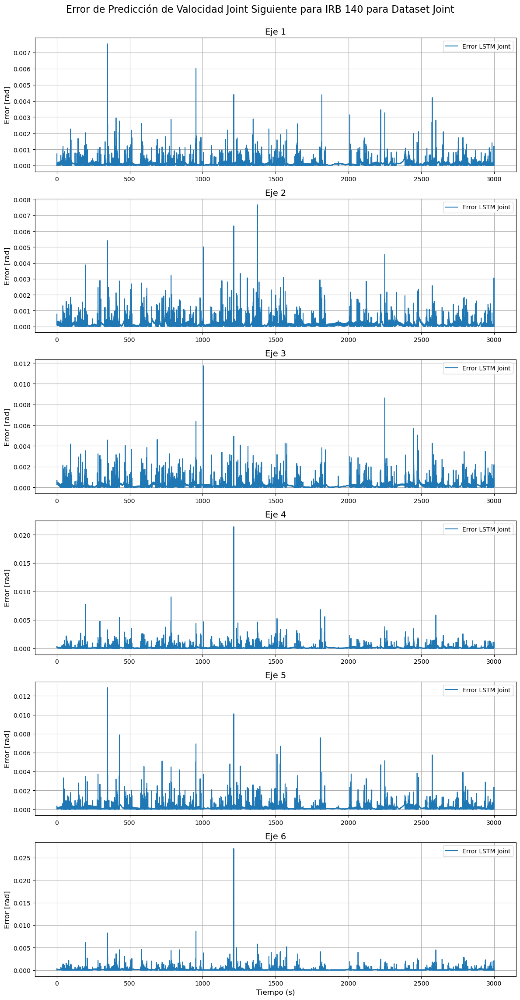

In [61]:
# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Error de Predicción de Valocidad Joint Siguiente para IRB 140 para Dataset Joint", 
             fontsize=16,  y=0.95)

# Graficar los errores
for i in range(num_links):
    plt.subplot(num_links, 1, i + 1)
    y_true = outputs_NEW[w_size:, i]            # Señal real 
    y_pred_lstm = q_sim_LSTM[:, i]     # Predicción LSTM

    # MAE
    mae_lstm = mean_absolute_error(y_true[:], y_pred_lstm)

    # MSE
    mse_lstm = mean_squared_error(y_true[:], y_pred_lstm)

    # R²
    r2_lstm = r2_score(y_true[:], y_pred_lstm)

    # Imprimir resultados
    print(f"Eje {i+1}:")
    print(f"LSTM - MAE: {mae_lstm:.6e}, MSE: {mse_lstm:.6e}, R²: {r2_lstm:.10f}")

    error_LSTM_Joint_j = np.sqrt((q_sim_LSTM[:, i] - outputs_NEW[w_size:, i])**2) *(np.pi/180.0)# Error cuadrático medio
    
    # Graficar los errores
    plt.plot(t_ref_LSTM[:], error_LSTM_Joint_j, label='Error LSTM Joint')
    
    # Ajustar etiquetas y título del subplot
    plt.ylabel(r'Error [rad]', fontsize=12)
    plt.title(f'Eje {i+1}', fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(True)  # Añadir una cuadrícula para facilitar la lectura

# Etiqueta para el eje X
plt.xlabel('Tiempo (s)', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])  

# Ajustar los espacios entre subplots
#plt.tight_layout(rect=[0, 0, 1, 0.95])  # Dejar espacio para el título general

# Mostrar el gráfico
plt.show()


# Verificación con Dataset Lineal

In [62]:
#Inputs ---> uk=[qTk-1  d_qTk-1  tauTk]T
time_joint_l= times['linear_NN_NN_2_time'][0:-2]

pos_j1_l = j_poses['linear_NN_NN_2_pos_j1'][0:-2] #34440 -> 34438, k-1
pos_j2_l = j_poses['linear_NN_NN_2_pos_j2'][0:-2]
pos_j3_l = j_poses['linear_NN_NN_2_pos_j3'][0:-2]
pos_j4_l = j_poses['linear_NN_NN_2_pos_j4'][0:-2]
pos_j5_l = j_poses['linear_NN_NN_2_pos_j5'][0:-2]
pos_j6_l = j_poses['linear_NN_NN_2_pos_j6'][0:-2]

vels_j1_l = j_vels['linear_NN_NN_2_vel_j1'][0:-2] #34440 -> 34438 k-1
vels_j2_l = j_vels['linear_NN_NN_2_vel_j2'][0:-2]
vels_j3_l = j_vels['linear_NN_NN_2_vel_j3'][0:-2]
vels_j4_l = j_vels['linear_NN_NN_2_vel_j4'][0:-2]
vels_j5_l = j_vels['linear_NN_NN_2_vel_j5'][0:-2]
vels_j6_l = j_vels['linear_NN_NN_2_vel_j6'][0:-2]

torq_j1_l = j_torqs['linear_NN_NN_2_torq_j1'][1:-1] #34440 -> 34438 k
torq_j2_l = j_torqs['linear_NN_NN_2_torq_j2'][1:-1]
torq_j3_l = j_torqs['linear_NN_NN_2_torq_j3'][1:-1]
torq_j4_l = j_torqs['linear_NN_NN_2_torq_j4'][1:-1]
torq_j5_l = j_torqs['linear_NN_NN_2_torq_j5'][1:-1]
torq_j6_l = j_torqs['linear_NN_NN_2_torq_j6'][1:-1]

#Outputs
accs_j1_l = j_accels['linear_NN_NN_2_acc_j1'] #34438 k
accs_j2_l = j_accels['linear_NN_NN_2_acc_j2']
accs_j3_l = j_accels['linear_NN_NN_2_acc_j3']
accs_j4_l = j_accels['linear_NN_NN_2_acc_j4']
accs_j5_l = j_accels['linear_NN_NN_2_acc_j5']
accs_j6_l = j_accels['linear_NN_NN_2_acc_j6']

#Inputs ---> uk=[qTk-1  d_qTk-1  tauTk]T
pos_next_j1_l = j_poses['linear_NN_NN_2_pos_j1'][1:-1] #34440 -> 34438, k-1
pos_next_j2_l = j_poses['linear_NN_NN_2_pos_j2'][1:-1]
pos_next_j3_l = j_poses['linear_NN_NN_2_pos_j3'][1:-1]
pos_next_j4_l = j_poses['linear_NN_NN_2_pos_j4'][1:-1]
pos_next_j5_l = j_poses['linear_NN_NN_2_pos_j5'][1:-1]
pos_next_j6_l = j_poses['linear_NN_NN_2_pos_j6'][1:-1]

/var/folders/fh/g4nwx4rn28g_fjncv9fq4dyr0000gn/T/ipykernel_18453/1104719443.py:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize=10)


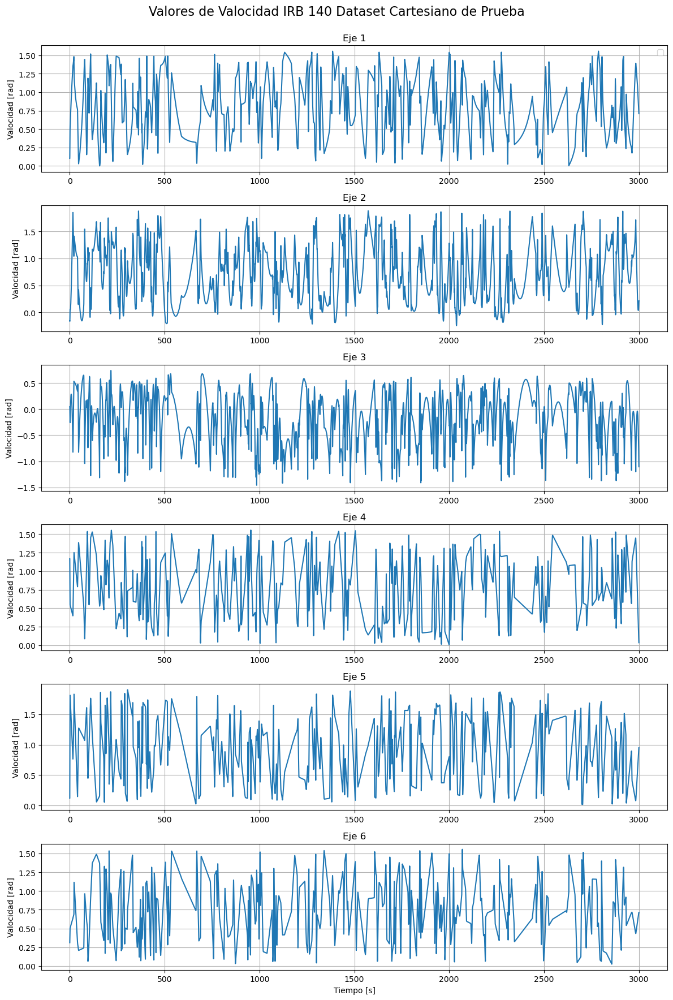

In [63]:
num_links = 6
plt.figure(figsize=(12, 18))
for i in range(num_links):
    plt.subplot(num_links, 1, i+1)
    plt.plot(time_joint_l, pos_j1_l * (np.pi/180.0) if i == 0 else
                        pos_j2_l * (np.pi/180.0) if i == 1 else
                        pos_j3_l * (np.pi/180.0) if i == 2 else
                        pos_j4_l * (np.pi/180.0) if i == 3 else
                        pos_j5_l * (np.pi/180.0) if i == 4 else
                        pos_j6_l * (np.pi/180.0))
    plt.ylabel('Valocidad [rad]')
    plt.title(f'Eje {i+1}')
    plt.grid(True)
    #plt.xlim([1900, 2200])
    if i == 0:
        plt.legend(loc='upper right', fontsize=10)
plt.xlabel('Tiempo [s]')
#plt.tight_layout() 
plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
plt.suptitle('Valores de Valocidad IRB 140 Dataset Cartesiano de Prueba', fontsize=16)
plt.show()

/var/folders/fh/g4nwx4rn28g_fjncv9fq4dyr0000gn/T/ipykernel_18453/4205324245.py:24: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize=10)


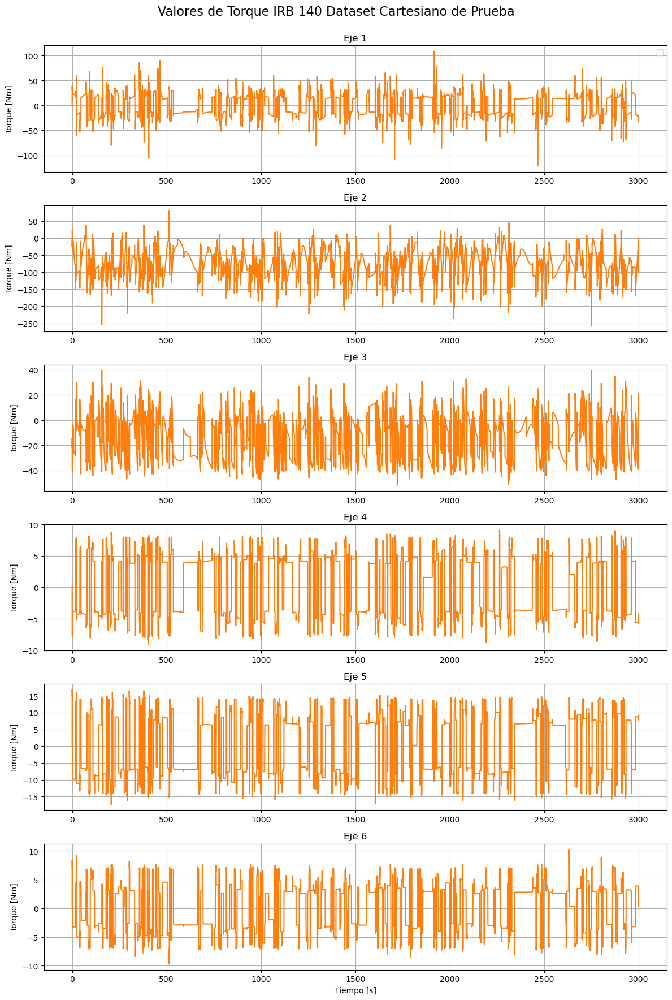

In [64]:
num_links = 6
plt.figure(figsize=(12, 18))

# Definir color naranja en hexadecimal
orange = '#ff7f0e'

for i in range(num_links):
    plt.subplot(num_links, 1, i+1)
    plt.plot(time_joint_l, 
             torq_j1_l if i == 0 else
             torq_j2_l if i == 1 else
             torq_j3_l if i == 2 else
             torq_j4_l if i == 3 else
             torq_j5_l if i == 4 else
             torq_j6_l,
             color=orange)
    
    plt.ylabel('Torque [Nm]')
    plt.title(f'Eje {i+1}')
    plt.grid(True)
    # plt.xlim([1900, 2200])  # opcional para zoom

    if i == 0:
        plt.legend(loc='upper right', fontsize=10)

plt.xlabel('Tiempo [s]')
plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
plt.suptitle('Valores de Torque IRB 140 Dataset Cartesiano de Prueba', fontsize=16)
plt.show()


In [65]:
inputs_lin = np.vstack((pos_j1_l, pos_j2_l, pos_j3_l, pos_j4_l, pos_j5_l, pos_j6_l, torq_j1_l, torq_j2_l, torq_j3_l, torq_j4_l, torq_j5_l, torq_j6_l)).T
outputs_lin = np.vstack((pos_next_j1_l,pos_next_j2_l,pos_next_j3_l,pos_next_j4_l,pos_next_j5_l,pos_next_j6_l)).T

In [66]:
X_test_scaled_LSTM_L = scaler1_LSTM.transform(inputs_lin)
X_test_windowed_LSTM_L, t_ref_LSTM_L = create_sequences_with_time(X_test_scaled_LSTM_L, time_joint_l)
q_sim_LSTM_L = scaler2_LSTM.inverse_transform(LSTM_network.predict(X_test_windowed_LSTM_L))

9374/9374 ━━━━━━━━━━━━━━━━━━━━ 67s 7ms/step


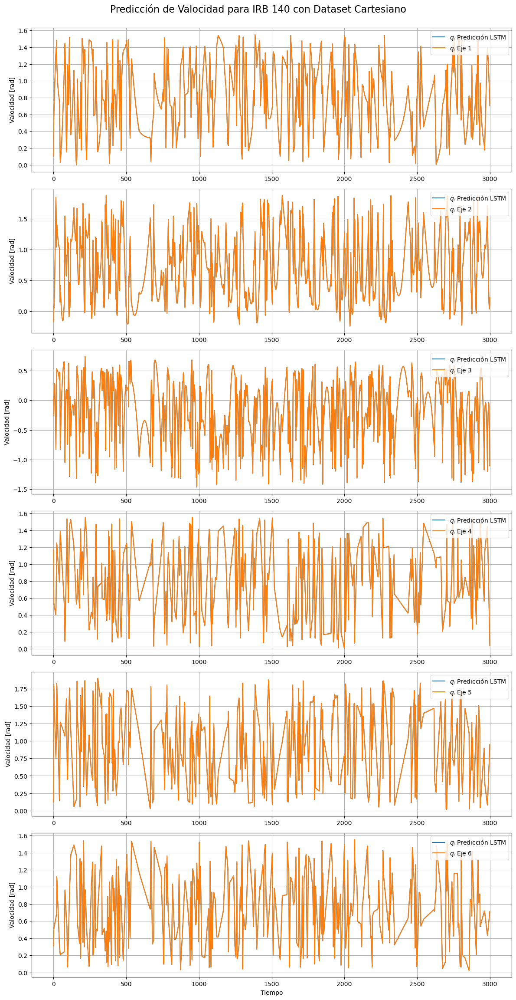

In [67]:
num_links = 6

# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Predicción de Valocidad para IRB 140 con Dataset Cartesiano", fontsize=16, y=0.95)

# Grafico los resultados
for i in range(num_links):
  plt.subplot(num_links, 1, i+1)
  plt.plot(t_ref_LSTM_L,q_sim_LSTM_L[:,i]*(np.pi/180.0))
  plt.plot( time_joint_l,outputs_lin[:,i]*(np.pi/180.0))
  plt.ylabel('Valocidad [rad]')
  plt.legend([r"$q_{i}$ Predicción LSTM", r"$q_{i}$ " f'Eje {i+1}'],loc='upper right', 
             fontsize=10)
  plt.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.xlabel('Tiempo');
plt.show()

Eje 1:
LSTM - MAE: 5.211398e-03, MSE: 8.933928e-05, R²: 0.9999998086
Eje 2:
LSTM - MAE: 8.036617e-03, MSE: 2.268010e-04, R²: 0.9999997250
Eje 3:
LSTM - MAE: 1.162148e-02, MSE: 7.198476e-04, R²: 0.9999989313
Eje 4:
LSTM - MAE: 6.183456e-03, MSE: 1.652377e-04, R²: 0.9999996604
Eje 5:
LSTM - MAE: 7.041569e-03, MSE: 2.141599e-04, R²: 0.9999996920
Eje 6:
LSTM - MAE: 6.498809e-03, MSE: 1.591392e-04, R²: 0.9999996234


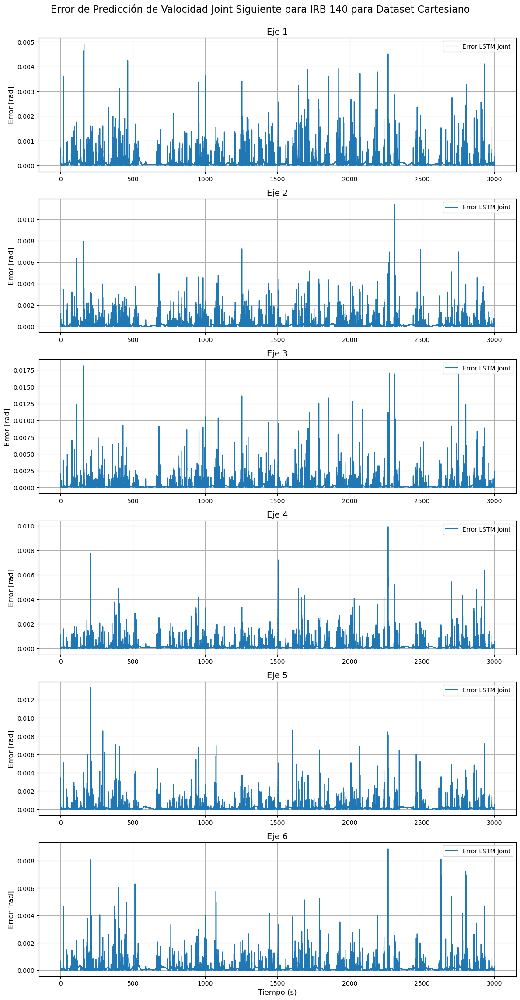

In [68]:
# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Error de Predicción de Valocidad Joint Siguiente para IRB 140 para Dataset Cartesiano", 
             fontsize=16,  y=0.95)

# Graficar los errores
for i in range(num_links):
    plt.subplot(num_links, 1, i + 1)
    y_true = outputs_lin[w_size:, i]            # Señal real 
    y_pred_lstm = q_sim_LSTM_L[:, i]     # Predicción LSTM

    # MAE
    mae_lstm = mean_absolute_error(y_true[:], y_pred_lstm)

    # MSE
    mse_lstm = mean_squared_error(y_true[:], y_pred_lstm)

    # R²
    r2_lstm = r2_score(y_true[:], y_pred_lstm)

    # Imprimir resultados
    print(f"Eje {i+1}:")
    print(f"LSTM - MAE: {mae_lstm:.6e}, MSE: {mse_lstm:.6e}, R²: {r2_lstm:.10f}")

    error_LSTM_Joint_L = np.sqrt((q_sim_LSTM_L[:, i] - outputs_lin[w_size:, i])**2) *(np.pi/180.0)
    
    # Graficar los errores
    plt.plot(t_ref_LSTM_L, error_LSTM_Joint_L, label='Error LSTM Joint')
    
    # Ajustar etiquetas y título del subplot
    plt.ylabel(r'Error [rad]', fontsize=12)
    plt.title(f'Eje {i+1}', fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(True)  # Añadir una cuadrícula para facilitar la lectura

# Etiqueta para el eje X
plt.xlabel('Tiempo (s)', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])  

# Ajustar los espacios entre subplots
#plt.tight_layout(rect=[0, 0, 1, 0.95])  # Dejar espacio para el título general

# Mostrar el gráfico
plt.show()


# **RECONSTRUCCIÓN DE LA VELOCIDAD Y ACELERACIÓN**

In [128]:
import numpy as np
from scipy.ndimage import gaussian_filter1d
from scipy.interpolate import CubicSpline

def reconstruir_dinamica(t, q_est, metodo="diferencias", sigma_1=10, sigma_2=10):
    """
    Reconstruye la velocidad y la aceleración a partir de posiciones estimadas y el vector de tiempo.
    
    Parámetros:
        t (np.ndarray): Vector de tiempo (N,).
        q_est (np.ndarray): Matriz de posiciones estimadas (N, DOF).
        metodo (str): Método a utilizar ("diferencias" o "spline").
        sigma_1 (float o list): Suavizado Gaussiano para velocidad (0 para desactivar).
        sigma_2 (float o list): Suavizado Gaussiano para aceleración (0 para desactivar).
        
    Retorna:
        qd_est (np.ndarray): Velocidad estimada (N, DOF).
        qdd_est (np.ndarray): Aceleración estimada (N, DOF).
    """
    t = np.asarray(t)
    q_est = np.asarray(q_est)

    if t.ndim != 1:
        raise ValueError("El vector de tiempo t debe ser unidimensional.")
    if q_est.shape[0] != t.shape[0]:
        raise ValueError("q_est y t deben tener la misma longitud en la primera dimensión.")

    if metodo == "diferencias":
        # Estimar velocidad usando np.gradient
        qd_est = np.gradient(q_est, t, axis=0)

        # Verifica que el paso de tiempo sea uniforme
        dt = np.diff(t)
        if not np.allclose(dt, dt[0]):
            raise ValueError("El vector de tiempo t debe tener paso uniforme para diferencias finitas centradas.")

        h = dt[0]
        N, DOF = qd_est.shape
        qdd_est = np.zeros_like(qd_est)

        # Aceleración a partir de la velocidad con esquema centrado de 5 puntos
        for i in range(DOF):
            vel = qd_est[:, i]
            acc = np.zeros_like(vel)

            acc[2:-2] = (-vel[4:] + 8 * vel[3:-1] - 8 * vel[1:-3] + vel[0:-4]) / (12 * h)

            # Bordes con diferencias hacia adelante/atrás
            #acc[0] = (vel[2] - 2 * vel[1] + vel[0]) / h**2
            acc[1] = (vel[3] - 2 * vel[2] + vel[1]) / h**2
            acc[-2] = (vel[-1] - 2 * vel[-2] + vel[-3]) / h**2
            acc[0] = acc[1]
            acc[-2] = acc[-1] 

            qdd_est[:, i] = acc

        # Suavizado opcional
        if sigma_1:
            if isinstance(sigma_1, (int, float)):
                qd_est = np.array([gaussian_filter1d(qd_est[:, i], sigma_1) for i in range(DOF)]).T
            else:
                qd_est = np.array([gaussian_filter1d(qd_est[:, i], s) for i, s in enumerate(sigma_1)]).T

        if sigma_2:
            if isinstance(sigma_2, (int, float)):
                qdd_est = np.array([gaussian_filter1d(qdd_est[:, i], sigma_2) for i in range(DOF)]).T
            else:
                qdd_est = np.array([gaussian_filter1d(qdd_est[:, i], s) for i, s in enumerate(sigma_2)]).T

    elif metodo == "spline":
        qd_est = np.zeros_like(q_est)
        qdd_est = np.zeros_like(q_est)

        for i in range(q_est.shape[1]):
            spline = CubicSpline(t, q_est[:, i], bc_type='natural')
            qd_est[:, i] = spline.derivative(1)(t)
            qdd_est[:, i] = spline.derivative(2)(t)

        if sigma_1:
            if isinstance(sigma_1, (int, float)):
                qd_est = np.array([gaussian_filter1d(qd_est[:, i], sigma_1) for i in range(qd_est.shape[1])]).T
            else:
                qd_est = np.array([gaussian_filter1d(qd_est[:, i], s) for i, s in enumerate(sigma_1)]).T

        if sigma_2:
            if isinstance(sigma_2, (int, float)):
                qdd_est = np.array([gaussian_filter1d(qdd_est[:, i], sigma_2) for i in range(qdd_est.shape[1])]).T
            else:
                qdd_est = np.array([gaussian_filter1d(qdd_est[:, i], s) for i, s in enumerate(sigma_2)]).T

    else:
        raise ValueError("Método no reconocido. Use 'diferencias' o 'spline'.")

    return qd_est, qdd_est


In [129]:
dq_ref = np.vstack((vels_j1_l, vels_j2_l, vels_j3_l, vels_j4_l, vels_j5_l, vels_j6_l)).T
ddq_ref = np.vstack((accs_j1_l, accs_j2_l, accs_j3_l, accs_j4_l, accs_j5_l, accs_j6_l)).T 

In [130]:
qd_spline_2, qdd_spline_2 = reconstruir_dinamica(t_ref_LSTM_L, q_sim_LSTM_L, metodo="spline", sigma_1=2, sigma_2=2)
qd_diff_2, qdd_diff_2 = reconstruir_dinamica(t_ref_LSTM_L, q_sim_LSTM_L, metodo="diferencias", sigma_1=2, sigma_2=2)

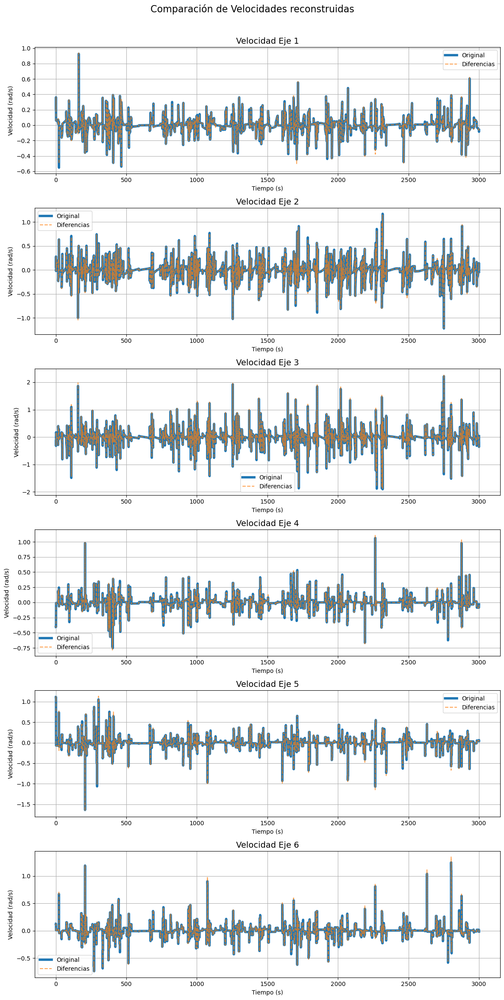

In [132]:
# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Comparación de Velocidades reconstruidas", fontsize=16)

for i in range(num_links):
    plt.subplot(num_links, 1, i + 1)

    # Velocidad - Comparación spline vs diferencias
    plt.plot(t_ref_LSTM_L, dq_ref[w_size:,i]*(np.pi/180), label="Original", linewidth=4)
    #plt.plot(t_ref_LSTM_L, qd_spline_2[:,i]*(np.pi/180), label="Spline", linewidth=2)
    plt.plot(t_ref_LSTM_L, qd_diff_2[:,i]*(np.pi/180), linestyle="dashed", label="Diferencias", alpha=0.7)
    plt.xlabel("Tiempo (s)")
    plt.ylabel("Velocidad (rad/s)")
    plt.title(f'Velocidad Eje {i+1}', fontsize=14)
    plt.legend()
    #plt.xlim([0, 200])
    plt.grid()


plt.tight_layout(rect=[0, 0, 1, 0.97])  

plt.show()

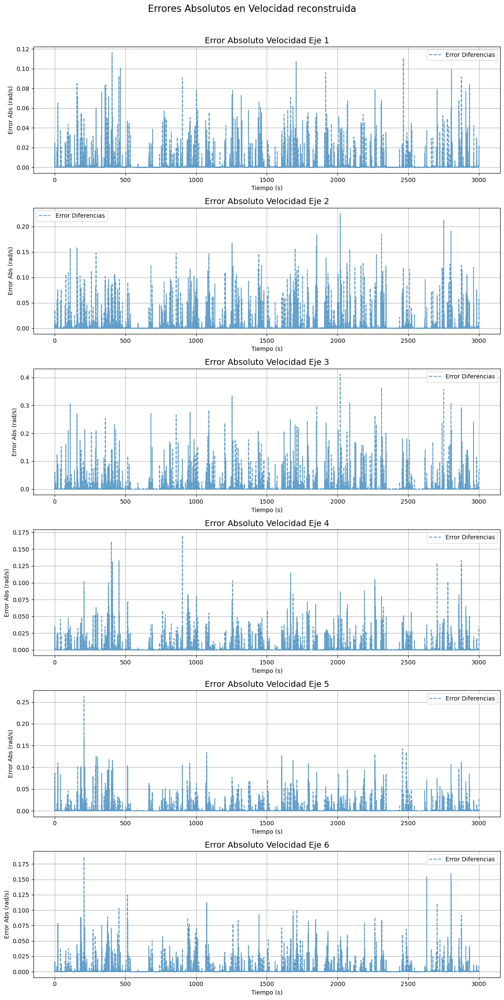

In [133]:
plt.figure(figsize=(12, 24))
plt.suptitle("Errores Absolutos en Velocidad reconstruida", fontsize=16)

for i in range(num_links):
    # Calcular errores absolutos
    abs_error_spline = np.abs(qd_spline_2[:,i] - dq_ref[w_size:,i])*(np.pi/180)
    abs_error_diff = np.abs(qd_diff_2[:,i] - dq_ref[w_size:,i])*(np.pi/180)
    plt.subplot(num_links, 1, i + 1)
    #plt.plot(t_ref_LSTM, abs_error_spline, label="Error Spline")
    plt.plot(t_ref_LSTM, abs_error_diff, linestyle="dashed", label="Error Diferencias", alpha=0.7)
    plt.xlabel("Tiempo (s)")
    plt.ylabel("Error Abs (rad/s)")
    plt.title(f'Error Absoluto Velocidad Eje {i+1}', fontsize=14)
    plt.legend()
    plt.grid()

plt.tight_layout()
plt.tight_layout(rect=[0, 0, 1, 0.97])  

plt.show()


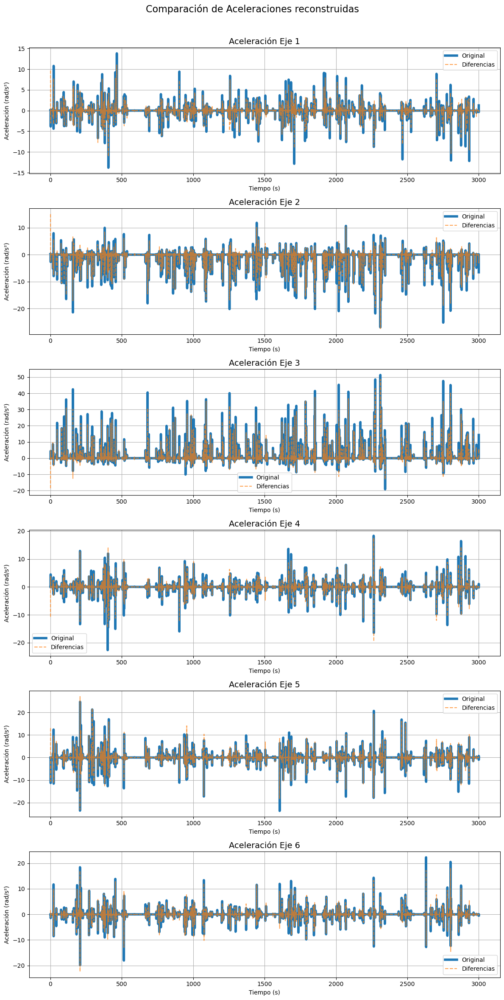

In [134]:
# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Comparación de Aceleraciones reconstruidas", fontsize=16)

for i in range(num_links):
    plt.subplot(num_links, 1, i + 1)


# Aceleración - Comparación spline vs diferencias
    plt.plot(t_ref_LSTM_L, ddq_ref[w_size:-2,i]*(np.pi/180), label="Original", linewidth=4)
    #plt.plot(t_ref_LSTM, qdd_spline_2[:,i]*(np.pi/180), label="Spline", linewidth=2)
    plt.plot(t_ref_LSTM[:], qdd_diff_2[:,i]*(np.pi/180), linestyle="dashed", label="Diferencias", alpha=0.7)
    plt.xlabel("Tiempo (s)")
    plt.ylabel("Aceleración (rad/s²)")
    plt.title(f'Aceleración Eje {i+1}', fontsize=14)
    plt.legend()
    plt.grid()
    #plt.xlim([0, 25])

plt.tight_layout()
plt.tight_layout(rect=[0, 0, 1, 0.97])  
plt.show()

9.505129671133501
14.733583316778192
18.219683552316987
10.671020341871424
13.011875635856043
8.728704893339875


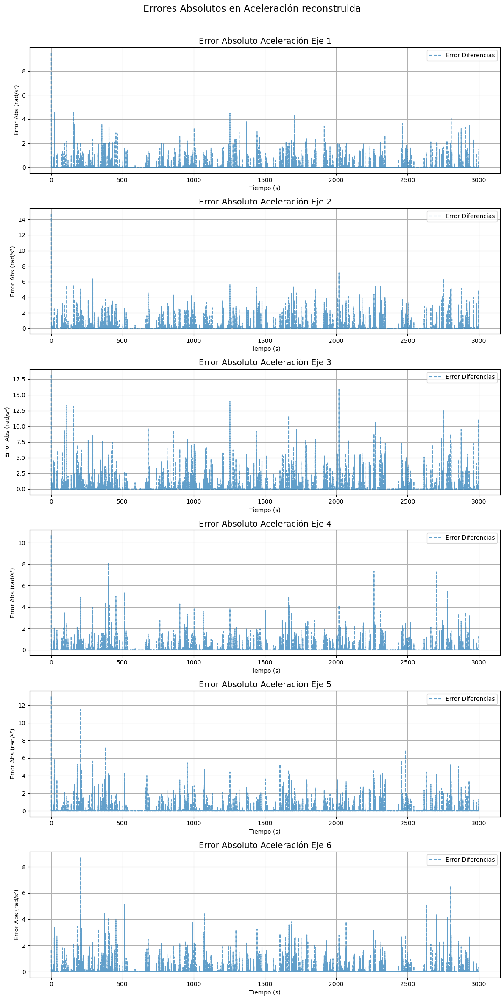

In [135]:
plt.figure(figsize=(12, 24))
plt.suptitle("Errores Absolutos en Aceleración reconstruida", fontsize=16)

for i in range(num_links):
    # Calcular errores absolutos
    abs_error_spline = np.abs(qdd_spline_2[:,i] - ddq_ref[w_size:-2,i])*(np.pi/180)
    abs_error_diff = np.abs(qdd_diff_2[:,i] - ddq_ref[w_size:-2,i])*(np.pi/180)

    print(max(abs_error_diff))
    plt.subplot(num_links, 1, i + 1)
    #plt.plot(t_ref_LSTM, abs_error_spline, label="Error Spline")
    plt.plot(t_ref_LSTM, abs_error_diff, linestyle="dashed", label="Error Diferencias", alpha=0.7)
    plt.xlabel("Tiempo (s)")
    plt.ylabel(f'Error Abs (rad/s²)')
    plt.title(f'Error Absoluto Aceleración Eje {i+1}', fontsize=14)
    plt.legend()
    plt.grid()

plt.tight_layout()
plt.tight_layout(rect=[0, 0, 1, 0.97])  

plt.show()


In [136]:
time_SIM = t_ref_LSTM
inputs_SIM = np.vstack((q_sim_LSTM_L[:,0], q_sim_LSTM_L[:,1], q_sim_LSTM_L[:,2], q_sim_LSTM_L[:,3], q_sim_LSTM_L[:,4], q_sim_LSTM_L[:,5], qd_diff_2[:,0], qd_diff_2[:,1], qd_diff_2[:,2], qd_diff_2[:,3], qd_diff_2[:,4], qd_diff_2[:,5], qdd_diff_2[:,0], qdd_diff_2[:,1], qdd_diff_2[:,2], qdd_diff_2[:,3], qdd_diff_2[:,4], qdd_diff_2[:,5])).T
outputs_SIM = np.vstack((torq_j1_l[w_size:], torq_j2_l[w_size:], torq_j3_l[w_size:], torq_j4_l[w_size:], torq_j5_l[w_size:], torq_j6_l[w_size:])).T

In [137]:
inputs_SIM.shape
#outputs_SIM.shape

(299947, 18)

# **PROBLEMA DINÁMICO INVERSO**

In [138]:
time_joint_ID= times['NN_NN_1_time'][2:-2]

pos_j1_j_ID = j_poses['NN_NN_1_pos_j1'][2:-2]
pos_j2_j_ID = j_poses['NN_NN_1_pos_j2'][2:-2]
pos_j3_j_ID = j_poses['NN_NN_1_pos_j3'][2:-2] 
pos_j4_j_ID = j_poses['NN_NN_1_pos_j4'][2:-2] 
pos_j5_j_ID = j_poses['NN_NN_1_pos_j5'][2:-2] 
pos_j6_j_ID = j_poses['NN_NN_1_pos_j6'][2:-2] 

vels_j1_j_ID = j_vels['NN_NN_1_vel_j1'][2:-2]  
vels_j2_j_ID = j_vels['NN_NN_1_vel_j2'][2:-2] 
vels_j3_j_ID = j_vels['NN_NN_1_vel_j3'][2:-2] 
vels_j4_j_ID = j_vels['NN_NN_1_vel_j4'][2:-2] 
vels_j5_j_ID = j_vels['NN_NN_1_vel_j5'][2:-2] 
vels_j6_j_ID = j_vels['NN_NN_1_vel_j6'][2:-2] 

torq_j1_j_ID = j_torqs['NN_NN_1_torq_j1'][2:-2]  
torq_j2_j_ID = j_torqs['NN_NN_1_torq_j2'][2:-2] 
torq_j3_j_ID = j_torqs['NN_NN_1_torq_j3'][2:-2] 
torq_j4_j_ID = j_torqs['NN_NN_1_torq_j4'][2:-2] 
torq_j5_j_ID = j_torqs['NN_NN_1_torq_j5'][2:-2] 
torq_j6_j_ID = j_torqs['NN_NN_1_torq_j6'][2:-2] 

accs_j1_j_ID = j_accels['NN_NN_1_acc_j1'][2:-2]
accs_j2_j_ID = j_accels['NN_NN_1_acc_j2'][2:-2] 
accs_j3_j_ID = j_accels['NN_NN_1_acc_j3'][2:-2] 
accs_j4_j_ID = j_accels['NN_NN_1_acc_j4'][2:-2] 
accs_j5_j_ID = j_accels['NN_NN_1_acc_j5'][2:-2] 
accs_j6_j_ID = j_accels['NN_NN_1_acc_j6'][2:-2] 

In [139]:
pos_j1 = np.concatenate([j_poses['NN_NN_1_pos_j1'][2:-2],j_poses['linear_NN_NN_pos_j1'][2:-2],j_poses['NN_NN_2_pos_j1'][2:-2],j_poses['linear_NN_NN_2_pos_j1'][2:-2]])
pos_j2 = np.concatenate([j_poses['NN_NN_1_pos_j2'][2:-2],j_poses['linear_NN_NN_pos_j2'][2:-2],j_poses['NN_NN_2_pos_j2'][2:-2],j_poses['linear_NN_NN_2_pos_j2'][2:-2]])
pos_j3 = np.concatenate([j_poses['NN_NN_1_pos_j3'][2:-2],j_poses['linear_NN_NN_pos_j3'][2:-2],j_poses['NN_NN_2_pos_j3'][2:-2],j_poses['linear_NN_NN_2_pos_j3'][2:-2]])
pos_j4 = np.concatenate([j_poses['NN_NN_1_pos_j4'][2:-2],j_poses['linear_NN_NN_pos_j4'][2:-2],j_poses['NN_NN_2_pos_j4'][2:-2],j_poses['linear_NN_NN_2_pos_j4'][2:-2]])
pos_j5 = np.concatenate([j_poses['NN_NN_1_pos_j5'][2:-2],j_poses['linear_NN_NN_pos_j5'][2:-2],j_poses['NN_NN_2_pos_j5'][2:-2],j_poses['linear_NN_NN_2_pos_j5'][2:-2]])
pos_j6 = np.concatenate([j_poses['NN_NN_1_pos_j6'][2:-2],j_poses['linear_NN_NN_pos_j6'][2:-2],j_poses['NN_NN_2_pos_j6'][2:-2],j_poses['linear_NN_NN_2_pos_j6'][2:-2]])

vels_j1 = np.concatenate([j_vels['NN_NN_1_vel_j1'][2:-2],j_vels['linear_NN_NN_vel_j1'][2:-2],j_vels['NN_NN_2_vel_j1'][2:-2],j_vels['linear_NN_NN_2_vel_j1'][2:-2]])
vels_j2 = np.concatenate([j_vels['NN_NN_1_vel_j2'][2:-2],j_vels['linear_NN_NN_vel_j2'][2:-2],j_vels['NN_NN_2_vel_j2'][2:-2],j_vels['linear_NN_NN_2_vel_j2'][2:-2]])
vels_j3 = np.concatenate([j_vels['NN_NN_1_vel_j3'][2:-2],j_vels['linear_NN_NN_vel_j3'][2:-2],j_vels['NN_NN_2_vel_j3'][2:-2],j_vels['linear_NN_NN_2_vel_j3'][2:-2]])
vels_j4 = np.concatenate([j_vels['NN_NN_1_vel_j4'][2:-2],j_vels['linear_NN_NN_vel_j4'][2:-2],j_vels['NN_NN_2_vel_j4'][2:-2],j_vels['linear_NN_NN_2_vel_j4'][2:-2]])
vels_j5 = np.concatenate([j_vels['NN_NN_1_vel_j5'][2:-2],j_vels['linear_NN_NN_vel_j5'][2:-2],j_vels['NN_NN_2_vel_j5'][2:-2],j_vels['linear_NN_NN_2_vel_j5'][2:-2]])
vels_j6 = np.concatenate([j_vels['NN_NN_1_vel_j6'][2:-2],j_vels['linear_NN_NN_vel_j6'][2:-2],j_vels['NN_NN_2_vel_j6'][2:-2],j_vels['linear_NN_NN_2_vel_j6'][2:-2]])

torq_j1 = np.concatenate([j_torqs['NN_NN_1_torq_j1'][2:-2],j_torqs['linear_NN_NN_torq_j1'][2:-2],j_torqs['NN_NN_2_torq_j1'][2:-2],j_torqs['linear_NN_NN_2_torq_j1'][2:-2]])
torq_j2 = np.concatenate([j_torqs['NN_NN_1_torq_j2'][2:-2],j_torqs['linear_NN_NN_torq_j2'][2:-2],j_torqs['NN_NN_2_torq_j2'][2:-2],j_torqs['linear_NN_NN_2_torq_j2'][2:-2]])
torq_j3 = np.concatenate([j_torqs['NN_NN_1_torq_j3'][2:-2],j_torqs['linear_NN_NN_torq_j3'][2:-2],j_torqs['NN_NN_2_torq_j3'][2:-2],j_torqs['linear_NN_NN_2_torq_j3'][2:-2]])
torq_j4 = np.concatenate([j_torqs['NN_NN_1_torq_j4'][2:-2],j_torqs['linear_NN_NN_torq_j4'][2:-2],j_torqs['NN_NN_2_torq_j4'][2:-2],j_torqs['linear_NN_NN_2_torq_j4'][2:-2]])
torq_j5 = np.concatenate([j_torqs['NN_NN_1_torq_j5'][2:-2],j_torqs['linear_NN_NN_torq_j5'][2:-2],j_torqs['NN_NN_2_torq_j5'][2:-2],j_torqs['linear_NN_NN_2_torq_j5'][2:-2]])
torq_j6 = np.concatenate([j_torqs['NN_NN_1_torq_j6'][2:-2],j_torqs['linear_NN_NN_torq_j6'][2:-2],j_torqs['NN_NN_2_torq_j6'][2:-2],j_torqs['linear_NN_NN_2_torq_j6'][2:-2]])

accs_j1 = np.concatenate([j_accels['NN_NN_1_acc_j1'][2:-2],j_accels['linear_NN_NN_acc_j1'][2:-2],j_accels['NN_NN_2_acc_j1'][2:-2],j_accels['linear_NN_NN_2_acc_j1'][2:-2]])
accs_j2 = np.concatenate([j_accels['NN_NN_1_acc_j2'][2:-2],j_accels['linear_NN_NN_acc_j2'][2:-2],j_accels['NN_NN_2_acc_j2'][2:-2],j_accels['linear_NN_NN_2_acc_j2'][2:-2]])
accs_j3 = np.concatenate([j_accels['NN_NN_1_acc_j3'][2:-2],j_accels['linear_NN_NN_acc_j3'][2:-2],j_accels['NN_NN_2_acc_j3'][2:-2],j_accels['linear_NN_NN_2_acc_j3'][2:-2]])
accs_j4 = np.concatenate([j_accels['NN_NN_1_acc_j4'][2:-2],j_accels['linear_NN_NN_acc_j4'][2:-2],j_accels['NN_NN_2_acc_j4'][2:-2],j_accels['linear_NN_NN_2_acc_j4'][2:-2]])
accs_j5 = np.concatenate([j_accels['NN_NN_1_acc_j5'][2:-2],j_accels['linear_NN_NN_acc_j5'][2:-2],j_accels['NN_NN_2_acc_j5'][2:-2],j_accels['linear_NN_NN_2_acc_j5'][2:-2]])
accs_j6 = np.concatenate([j_accels['NN_NN_1_acc_j6'][2:-2],j_accels['linear_NN_NN_acc_j6'][2:-2],j_accels['NN_NN_2_acc_j6'][2:-2],j_accels['linear_NN_NN_2_acc_j6'][2:-2]])

In [140]:
#inputs = np.vstack((inputs_joint[:294660,:], inputs_cart))
#outputs = np.vstack((outputs_joint[:294660,:], outputs_cart))
inputs = np.vstack((pos_j1, pos_j2, pos_j3, pos_j4, pos_j5, pos_j6, vels_j1, vels_j2, vels_j3, vels_j4, vels_j5, vels_j6, accs_j1, accs_j2, accs_j3, accs_j4, accs_j5, accs_j6)).T
outputs = np.vstack((torq_j1, torq_j2, torq_j3, torq_j4, torq_j5, torq_j6)).T
inputs.shape

(1199980, 18)

In [141]:
X_train_FF_t, X_test_FF_t, y_train_FF_t, y_test_FF_t = train_test_split(inputs, outputs, test_size = 0.2)

#Tengo que hacer preprocesado de los datos para que los calculos no sean tan pesados
scaler1_FF_t = StandardScaler() #RobustScaler()#
X_train_FF_t = scaler1_FF_t.fit_transform(X_train_FF_t)#Primero se llama a la funcion fit para que ajuste los datos
X_test_FF_t = scaler1_FF_t.transform(X_test_FF_t) #Una vez que los datos fueron ajustados se puede llamar a la transformacion directamente
#X_val_FF_t = scaler1_FF_t.transform(X_val_FF_t)

#Lo mismo para los outputs
scaler2_FF_t = StandardScaler() #RobustScaler()#
y_train_FF_t = scaler2_FF_t.fit_transform(y_train_FF_t)
y_test_FF_t = scaler2_FF_t.transform(y_test_FF_t)
#y_val_FF_t = scaler2_FF_t.transform(y_val_FF_t)

In [142]:
X_train_FF_t.shape

(959984, 18)

In [143]:
X_test_FF_t.shape

(239996, 18)

# Red Feed-Forward

🔄 Cargando modelo FF NN existente...


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 100)            │         1,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 6)              │           606 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 68,120 (266.10 KB)

 Trainable params: 22,706 (88.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 45,414 (177.40 KB)

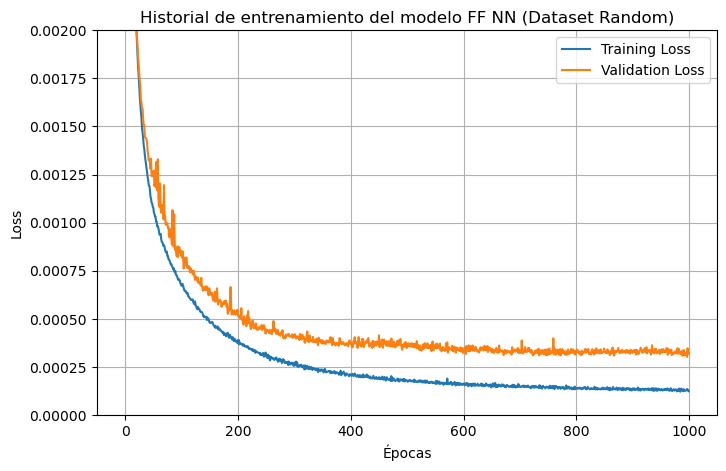

✅ Modelo FF NN listo para usar.


In [144]:
# Verificar si el modelo ya existe

FF_NN_model_path = "./IRB_140/ID_NN/Modelos_NN/FF_NN_random/ff_nn_Best_Model.keras"
FF_NN_history_path = "./IRB_140/ID_NN/Modelos_NN/FF_NN_random/ff_nn_best_history.json"

if os.path.exists(FF_NN_model_path):
    print("🔄 Cargando modelo FF NN existente...")
    FF_SS_network = keras.models.load_model(FF_NN_model_path)
    FF_SS_network.summary()

    if os.path.exists(FF_NN_history_path):
        with open(FF_NN_history_path, "r") as f:
            FF_NN_history = json.load(f)  # Load the history data as a dictionary

        # Create a dummy History object for plotting:
        #FF_NN_history = type('DummyHistory', (object,), {'history': FF_NN_history_dict})()

        # Graficar el history
        plt.figure(figsize=(8, 5))
        plt.plot(FF_NN_history["loss"], label="Training Loss")
        plt.plot(FF_NN_history["val_loss"], label="Validation Loss")
        plt.legend()
        plt.xlabel("Épocas")
        plt.ylabel("Loss")
        plt.grid(True)
        plt.gca().set_ylim(0, 2e-3)
        plt.title("Historial de entrenamiento del modelo FF NN (Dataset Random)")
        plt.show()
    else:
        print("⚠️ No se encontró el archivo de history.")
else:
    print("⚙️ Creando nuevo modelo...")
    #Esta forma es lo más parecida posible al paper
    FF_SS_network = keras.models.Sequential([
        keras.layers.Input(shape=(inputs.shape[1],)),  # Input layer with the shape of the input data
        #keras.layers.LayerNormalization(epsilon=1e-4),
        keras.layers.Dense(100, activation="gelu"),  # First hidden layer with GELU activation
        #keras.layers.LayerNormalization(epsilon=1e-4),
        #keras.layers.Dropout(0.1),  # Dropout layer to prevent overfitting
        keras.layers.Dense(100, activation="gelu"),
        keras.layers.Dense(100, activation="gelu"),
        #keras.layers.Dense(100, activation="gelu"),
        #keras.layers.Dropout(0.1),  # Dropout layer to prevent overfitting        
        #keras.layers.Dense(64, activation="swish"),
        keras.layers.Dense(6)
    ])
    FF_SS_network.summary()

    FF_SS_network.compile(loss = 'mean_squared_error', optimizer=keras.optimizers.Adam(learning_rate=5e-4), 
                          metrics = ['mae'])#Que pasa si uso SGD con learning rate

    checkpoint_cb = keras.callbacks.ModelCheckpoint(FF_NN_model_path, 
                                                    save_best_only=True)
    early_stopping_cb = keras.callbacks.EarlyStopping(patience=200, min_delta=1e-10, restore_best_weights=True)

    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=20, min_lr=1e-8)       
    FF_NN_history = FF_SS_network.fit(X_train_FF_t, y_train_FF_t, epochs=1000, 
                                      batch_size=512, validation_split=0.3, 
                                      callbacks=[checkpoint_cb, early_stopping_cb])

    with open(FF_NN_history_path, "w") as f:
        json.dump(FF_NN_history.history, f)
    with open(FF_NN_history_path, "r") as f:
        FF_NN_history = json.load(f)  # Load the history data as a dictionary

    # Create a dummy History object for plotting:
    #FF_NN_history = type('DummyHistory', (object,), {'history': FF_NN_history_dict})()

    pd.DataFrame(FF_NN_history).plot(figsize=(8, 5))
    plt.grid(True)
    #plt.gca().set_xlim(0, 1)
    plt.gca().set_ylim(0, 2e-3)
    plt.show()

print("✅ Modelo FF NN listo para usar.")

In [145]:
accuracy_test_NN = FF_SS_network.evaluate(X_test_FF_t, y_test_FF_t)

7500/7500 ━━━━━━━━━━━━━━━━━━━━ 9s 1ms/step - loss: 2.5337e-04 - mae: 0.0056


In [146]:
predictions_NN = FF_SS_network.predict(X_test_FF_t)

7500/7500 ━━━━━━━━━━━━━━━━━━━━ 6s 735us/step


In [147]:
predictions_NN[0]

array([-1.4273994 ,  0.8745153 ,  0.5252443 ,  0.78765845, -0.9508792 ,
        0.7742864 ], dtype=float32)

In [148]:
y_test_FF_t[0]

array([-1.42791784,  0.87660701,  0.53810454,  0.78734134, -0.94572299,
        0.77867434])

# Verificación de métricas y validación con nuevo dataset

In [149]:
time_joint_N= times['NN_NN_4_time'][2:-2]

pos_j1_N = j_poses['NN_NN_4_pos_j1'][2:-2] 
pos_j2_N = j_poses['NN_NN_4_pos_j2'][2:-2]
pos_j3_N = j_poses['NN_NN_4_pos_j3'][2:-2] 
pos_j4_N = j_poses['NN_NN_4_pos_j4'][2:-2] 
pos_j5_N = j_poses['NN_NN_4_pos_j5'][2:-2] 
pos_j6_N = j_poses['NN_NN_4_pos_j6'][2:-2] 

vels_j1_N = j_vels['NN_NN_4_vel_j1'][2:-2]  
vels_j2_N = j_vels['NN_NN_4_vel_j2'][2:-2] 
vels_j3_N = j_vels['NN_NN_4_vel_j3'][2:-2] 
vels_j4_N = j_vels['NN_NN_4_vel_j4'][2:-2] 
vels_j5_N = j_vels['NN_NN_4_vel_j5'][2:-2] 
vels_j6_N = j_vels['NN_NN_4_vel_j6'][2:-2] 

torq_j1_N = j_torqs['NN_NN_4_torq_j1'][2:-2]  
torq_j2_N = j_torqs['NN_NN_4_torq_j2'][2:-2] 
torq_j3_N = j_torqs['NN_NN_4_torq_j3'][2:-2] 
torq_j4_N = j_torqs['NN_NN_4_torq_j4'][2:-2] 
torq_j5_N = j_torqs['NN_NN_4_torq_j5'][2:-2] 
torq_j6_N = j_torqs['NN_NN_4_torq_j6'][2:-2] 

#Outputs
accs_j1_N = j_accels['NN_NN_4_acc_j1'][2:-2]  
accs_j2_N = j_accels['NN_NN_4_acc_j2'][2:-2] 
accs_j3_N = j_accels['NN_NN_4_acc_j3'][2:-2] 
accs_j4_N = j_accels['NN_NN_4_acc_j4'][2:-2] 
accs_j5_N = j_accels['NN_NN_4_acc_j5'][2:-2] 
accs_j6_N = j_accels['NN_NN_4_acc_j6'][2:-2] 


pos_next_j1_N = j_poses['NN_NN_4_pos_j1'][2:-2]  
pos_next_j2_N = j_poses['NN_NN_4_pos_j2'][2:-2] 
pos_next_j3_N = j_poses['NN_NN_4_pos_j3'][2:-2] 
pos_next_j4_N = j_poses['NN_NN_4_pos_j4'][2:-2] 
pos_next_j5_N = j_poses['NN_NN_4_pos_j5'][2:-2] 
pos_next_j6_N = j_poses['NN_NN_4_pos_j6'][2:-2] 

In [150]:
inputs_NEW = np.vstack((pos_j1_N, pos_j2_N, pos_j3_N, pos_j4_N, pos_j5_N, pos_j6_N, vels_j1_N, vels_j2_N, vels_j3_N, vels_j4_N, vels_j5_N, vels_j6_N, accs_j1_N, accs_j2_N, accs_j3_N, accs_j4_N, accs_j5_N, accs_j6_N)).T
outputs_NEW = np.vstack((torq_j1_N, torq_j2_N, torq_j3_N, torq_j4_N, torq_j5_N, torq_j6_N)).T

In [151]:
X_test_scaled_FF = scaler1_FF_t.transform(inputs_NEW)
tau_sim_FF = scaler2_FF_t.inverse_transform(FF_SS_network.predict(X_test_scaled_FF))

9375/9375 ━━━━━━━━━━━━━━━━━━━━ 6s 647us/step


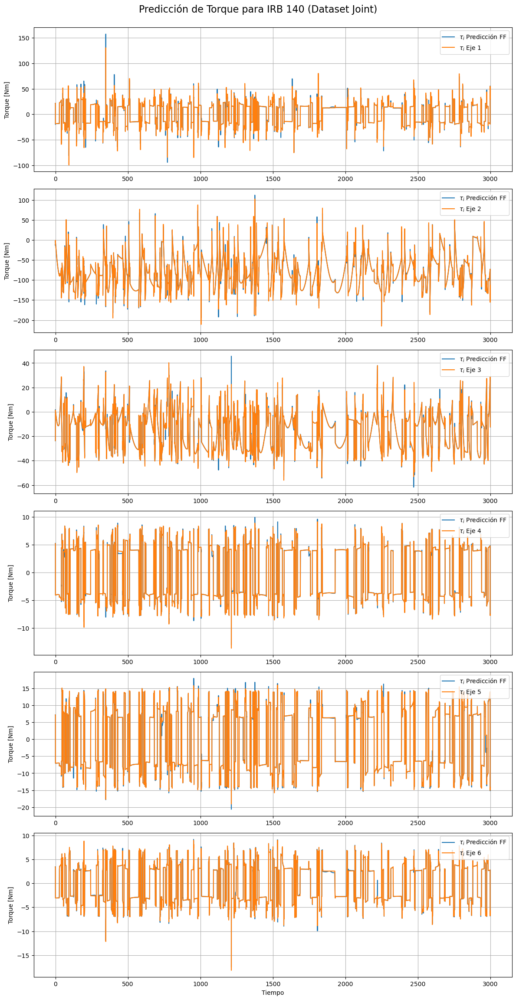

In [152]:
num_links = 6
t_ref = time_joint_N
# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Predicción de Torque para IRB 140 (Dataset Joint)", fontsize=16, y=0.95)

# Grafico los resultados
for i in range(num_links):
  plt.subplot(num_links, 1, i+1)
  plt.plot(time_joint_N,tau_sim_FF[:,i])
  plt.plot(time_joint_N,outputs_NEW[:,i])
  plt.ylabel('Torque [Nm]')
  plt.legend([r"$\tau_{i}$ Predicción FF", r"$\tau_{i}$ " f'Eje {i+1}'],loc='upper right', 
             fontsize=10)
  plt.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.xlabel('Tiempo');
plt.show()

Eje 1:
FF - MAE: 1.781017e-01, MSE: 3.856621e-01, R²: 0.9990142838
Eje 2:
FF - MAE: 2.815909e-01, MSE: 5.300655e-01, R²: 0.9996298110
Eje 3:
FF - MAE: 1.457582e-01, MSE: 1.570164e-01, R²: 0.9992699095
Eje 4:
FF - MAE: 3.890984e-02, MSE: 1.432301e-02, R²: 0.9993776434
Eje 5:
FF - MAE: 5.653817e-02, MSE: 7.764037e-02, R²: 0.9990301248
Eje 6:
FF - MAE: 3.006267e-02, MSE: 6.996776e-03, R²: 0.9995483612


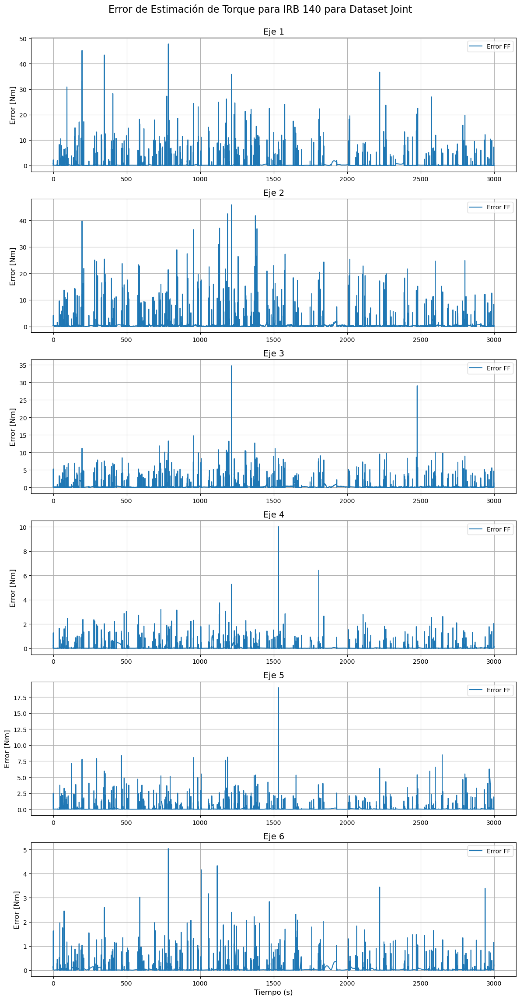

In [153]:
# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Error de Estimación de Torque para IRB 140 para Dataset Joint", 
             fontsize=16,  y=0.95)

# Graficar los errores
for i in range(num_links):
    plt.subplot(num_links, 1, i + 1)
    y_true = outputs_NEW[:, i]            # Señal real 
    y_pred_ff = tau_sim_FF[:, i]     # Predicción FF

    # MAE
    mae_ff = mean_absolute_error(y_true[:], y_pred_ff)

    # MSE
    mse_ff = mean_squared_error(y_true[:], y_pred_ff)

    # R²
    r2_ff = r2_score(y_true[:], y_pred_ff)

    # Imprimir resultados
    print(f"Eje {i+1}:")
    print(f"FF - MAE: {mae_ff:.6e}, MSE: {mse_ff:.6e}, R²: {r2_ff:.10f}")

    error_FF_J = np.sqrt((tau_sim_FF[:, i] - outputs_NEW[:, i])**2)
    
    # Graficar los errores
    plt.plot(time_joint_N, error_FF_J, label='Error FF')
    
    # Ajustar etiquetas y título del subplot
    plt.ylabel(r'Error [Nm]', fontsize=12)
    plt.title(f'Eje {i+1}', fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(True)  # Añadir una cuadrícula para facilitar la lectura

# Etiqueta para el eje X
plt.xlabel('Tiempo (s)', fontsize=12)

#plt.subplots_adjust(top=0.93)  

# Ajustar los espacios entre subplots
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Dejar espacio para el título general

# Mostrar el gráfico
plt.show()


# Verificación con Dataset Lineal

In [154]:
time_joint_L= times['linear_NN_NN_3_time'][2:-2]

pos_j1_L = j_poses['linear_NN_NN_3_pos_j1'][2:-2] 
pos_j2_L = j_poses['linear_NN_NN_3_pos_j2'][2:-2]
pos_j3_L = j_poses['linear_NN_NN_3_pos_j3'][2:-2] 
pos_j4_L = j_poses['linear_NN_NN_3_pos_j4'][2:-2] 
pos_j5_L = j_poses['linear_NN_NN_3_pos_j5'][2:-2] 
pos_j6_L = j_poses['linear_NN_NN_3_pos_j6'][2:-2] 

vels_j1_L = j_vels['linear_NN_NN_3_vel_j1'][2:-2]  
vels_j2_L = j_vels['linear_NN_NN_3_vel_j2'][2:-2] 
vels_j3_L = j_vels['linear_NN_NN_3_vel_j3'][2:-2] 
vels_j4_L = j_vels['linear_NN_NN_3_vel_j4'][2:-2] 
vels_j5_L = j_vels['linear_NN_NN_3_vel_j5'][2:-2] 
vels_j6_L = j_vels['linear_NN_NN_3_vel_j6'][2:-2] 

torq_j1_L = j_torqs['linear_NN_NN_3_torq_j1'][2:-2]  
torq_j2_L = j_torqs['linear_NN_NN_3_torq_j2'][2:-2] 
torq_j3_L = j_torqs['linear_NN_NN_3_torq_j3'][2:-2] 
torq_j4_L = j_torqs['linear_NN_NN_3_torq_j4'][2:-2] 
torq_j5_L = j_torqs['linear_NN_NN_3_torq_j5'][2:-2] 
torq_j6_L = j_torqs['linear_NN_NN_3_torq_j6'][2:-2] 

#Outputs
accs_j1_L = j_accels['linear_NN_NN_3_acc_j1'][2:-2]  
accs_j2_L = j_accels['linear_NN_NN_3_acc_j2'][2:-2] 
accs_j3_L = j_accels['linear_NN_NN_3_acc_j3'][2:-2] 
accs_j4_L = j_accels['linear_NN_NN_3_acc_j4'][2:-2] 
accs_j5_L = j_accels['linear_NN_NN_3_acc_j5'][2:-2] 
accs_j6_L = j_accels['linear_NN_NN_3_acc_j6'][2:-2] 

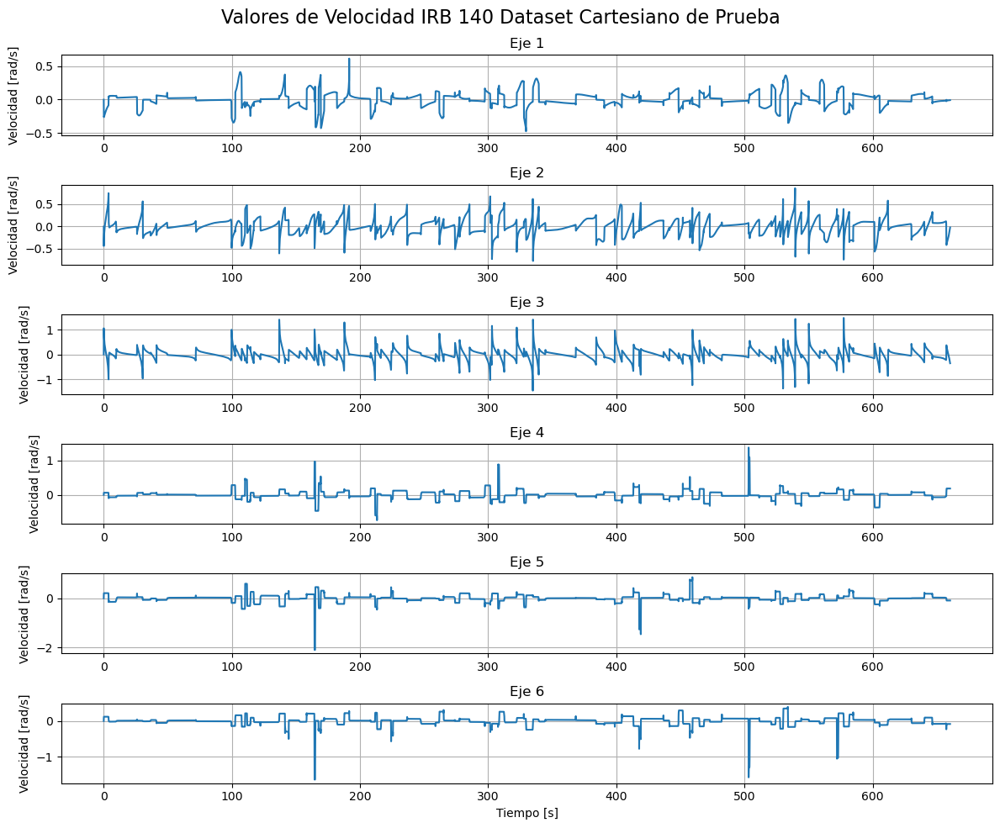

In [155]:
num_links = 6
plt.figure(figsize=(12, 10))
for i in range(num_links):
    plt.subplot(num_links, 1, i+1)
    plt.plot(time_joint_L, vels_j1_L * (np.pi/180.0) if i == 0 else
                        vels_j2_L * (np.pi/180.0) if i == 1 else
                        vels_j3_L * (np.pi/180.0) if i == 2 else
                        vels_j4_L * (np.pi/180.0) if i == 3 else
                        vels_j5_L * (np.pi/180.0) if i == 4 else
                        vels_j6_L * (np.pi/180.0))
    plt.ylabel('Velocidad [rad/s]')
    plt.title(f'Eje {i+1}')
    plt.grid(True)
    #plt.xlim([1900, 2200])

plt.xlabel('Tiempo [s]')
#plt.tight_layout() 
plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
plt.suptitle('Valores de Velocidad IRB 140 Dataset Cartesiano de Prueba', fontsize=16)
plt.show()

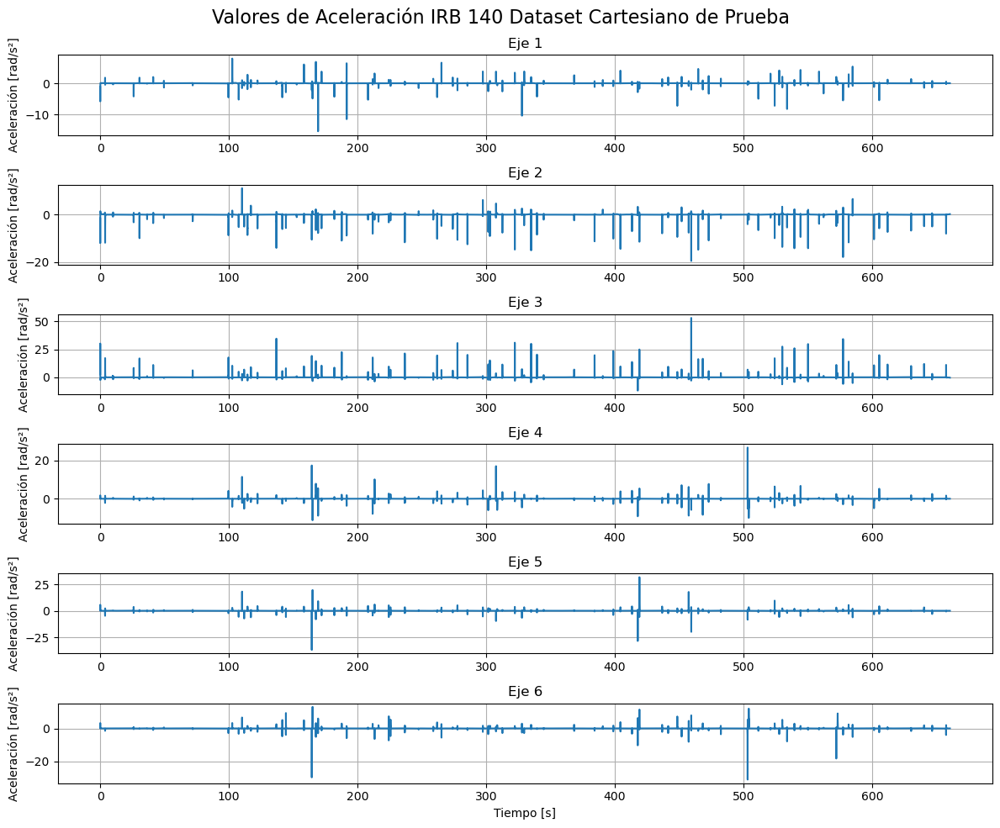

In [156]:
num_links = 6
plt.figure(figsize=(12, 10))
for i in range(num_links):
    plt.subplot(num_links, 1, i+1)
    plt.plot(time_joint_L, accs_j1_L * (np.pi/180.0) if i == 0 else
                        accs_j2_L * (np.pi/180.0) if i == 1 else
                        accs_j3_L * (np.pi/180.0) if i == 2 else
                        accs_j4_L * (np.pi/180.0) if i == 3 else
                        accs_j5_L * (np.pi/180.0) if i == 4 else
                        accs_j6_L * (np.pi/180.0))
    plt.ylabel('Aceleración [rad/s²]')
    plt.title(f'Eje {i+1}')
    plt.grid(True)
    #plt.xlim([1900, 2200])

plt.xlabel('Tiempo [s]')
#plt.tight_layout() 
plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
plt.suptitle('Valores de Aceleración IRB 140 Dataset Cartesiano de Prueba', fontsize=16)
plt.show()

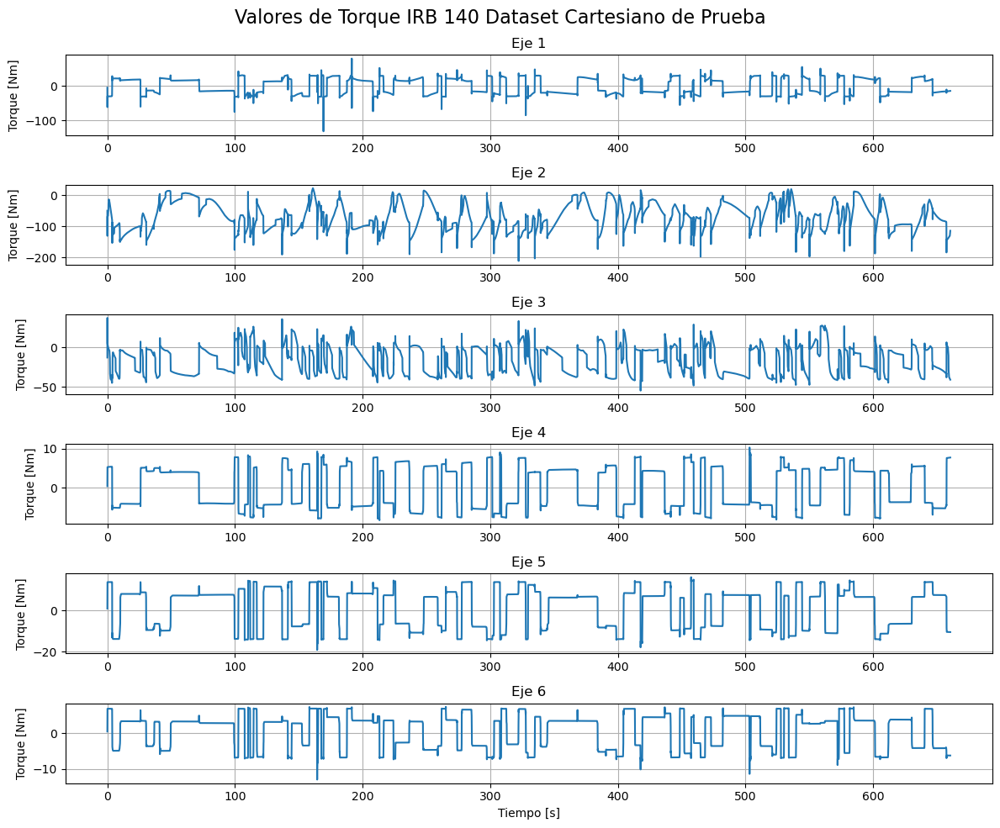

In [157]:
num_links = 6
plt.figure(figsize=(12, 10))
for i in range(num_links):
    plt.subplot(num_links, 1, i+1)
    plt.plot(time_joint_L, torq_j1_L if i == 0 else
                        torq_j2_L if i == 1 else
                        torq_j3_L  if i == 2 else
                        torq_j4_L  if i == 3 else
                        torq_j5_L  if i == 4 else
                        torq_j6_L)
    plt.ylabel('Torque [Nm]')
    plt.title(f'Eje {i+1}')
    plt.grid(True)
    #plt.xlim([1900, 2200])

plt.xlabel('Tiempo [s]')
#plt.tight_layout() 
plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
plt.suptitle('Valores de Torque IRB 140 Dataset Cartesiano de Prueba', fontsize=16)
plt.show()

In [158]:
inputs_NEW_L = np.vstack((pos_j1_L, pos_j2_L, pos_j3_L, pos_j4_L, pos_j5_L, pos_j6_L, vels_j1_L, vels_j2_L, vels_j3_L, vels_j4_L, vels_j5_L, vels_j6_L, accs_j1_L, accs_j2_L, accs_j3_L, accs_j4_L, accs_j5_L, accs_j6_L)).T
outputs_NEW_L = np.vstack((torq_j1_L, torq_j2_L, torq_j3_L, torq_j4_L, torq_j5_L, torq_j6_L)).T

In [159]:
X_test_scaled_FF_L = scaler1_FF_t.transform(inputs_NEW_L)
tau_sim_FF_L = scaler2_FF_t.inverse_transform(FF_SS_network.predict(X_test_scaled_FF_L))

2064/2064 ━━━━━━━━━━━━━━━━━━━━ 2s 753us/step


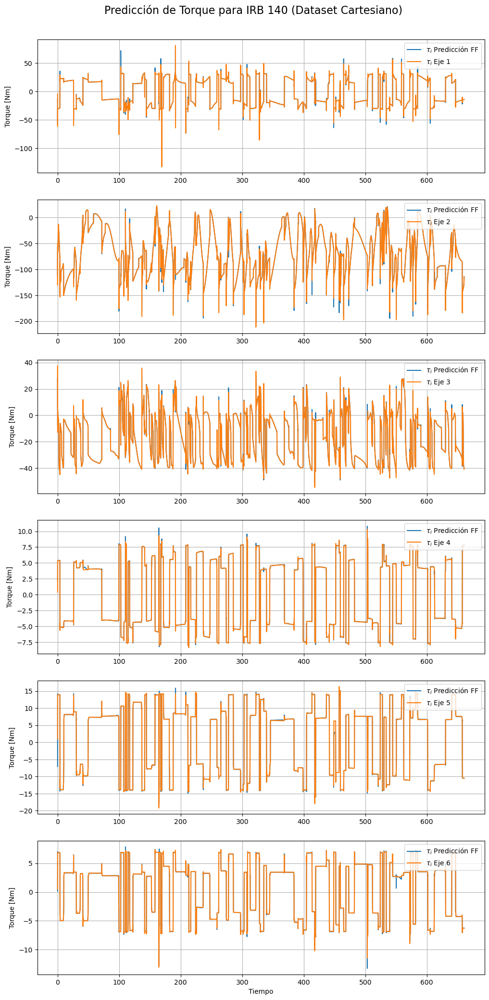

In [160]:
num_links = 6
# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Predicción de Torque para IRB 140 (Dataset Cartesiano)", fontsize=16, y=0.95)

# Grafico los resultados
for i in range(num_links):
  plt.subplot(num_links, 1, i+1)
  plt.plot(time_joint_L,tau_sim_FF_L[:,i])
  plt.plot(time_joint_L,outputs_NEW_L[:,i])
  plt.ylabel('Torque [Nm]')
  plt.legend([r"$\tau_{i}$ Predicción FF", r"$\tau_{i}$ " f'Eje {i+1}'],loc='upper right', 
             fontsize=10)
  plt.grid(True)

plt.subplots_adjust(top=0.92)  
plt.xlabel('Tiempo');
plt.show()

Eje 1:
FF - MAE: 1.834104e-01, MSE: 5.840918e-01, R²: 0.9988845374
Eje 2:
FF - MAE: 3.075397e-01, MSE: 8.213862e-01, R²: 0.9995303634
Eje 3:
FF - MAE: 1.206392e-01, MSE: 1.547751e-01, R²: 0.9994930645
Eje 4:
FF - MAE: 2.758396e-02, MSE: 6.090058e-03, R²: 0.9997890094
Eje 5:
FF - MAE: 6.154031e-02, MSE: 7.777588e-02, R²: 0.9991636542
Eje 6:
FF - MAE: 2.455301e-02, MSE: 3.829899e-03, R²: 0.9998250863


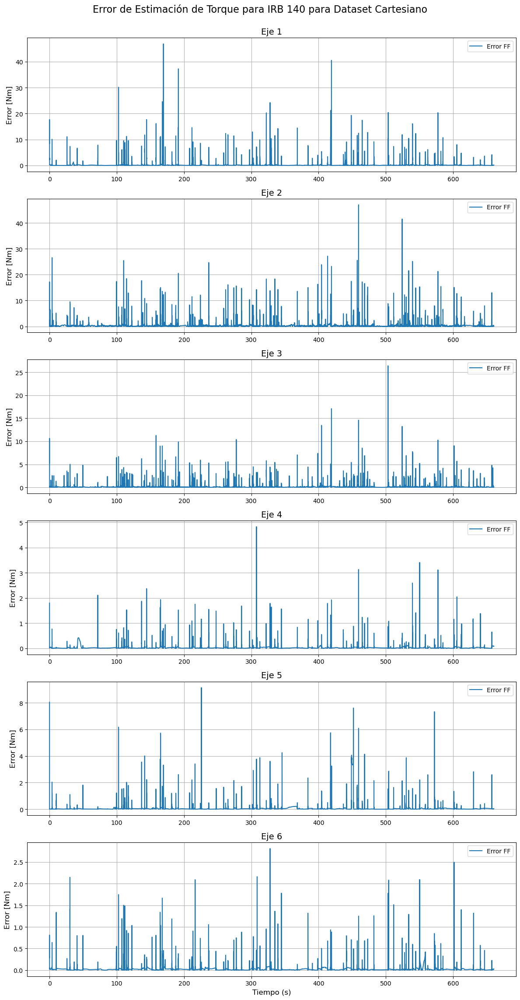

In [161]:
# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Error de Estimación de Torque para IRB 140 para Dataset Cartesiano", 
             fontsize=16,  y=0.95)

# Graficar los errores
for i in range(num_links):
    plt.subplot(num_links, 1, i + 1)
    y_true = outputs_NEW_L[:, i]            # Señal real 
    y_pred_ff = tau_sim_FF_L[:, i]     # Predicción FF

    # MAE
    mae_ff = mean_absolute_error(y_true[:], y_pred_ff)

    # MSE
    mse_ff = mean_squared_error(y_true[:], y_pred_ff)

    # R²
    r2_ff = r2_score(y_true[:], y_pred_ff)

    # Imprimir resultados
    print(f"Eje {i+1}:")
    print(f"FF - MAE: {mae_ff:.6e}, MSE: {mse_ff:.6e}, R²: {r2_ff:.10f}")

    error_FF_L = np.sqrt((tau_sim_FF_L[:, i] - outputs_NEW_L[:, i])**2)
    
    # Graficar los errores
    plt.plot(time_joint_L, error_FF_L, label='Error FF')
    
    # Ajustar etiquetas y título del subplot
    plt.ylabel(r'Error [Nm]', fontsize=12)
    plt.title(f'Eje {i+1}', fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(True)  # Añadir una cuadrícula para facilitar la lectura

# Etiqueta para el eje X
plt.xlabel('Tiempo (s)', fontsize=12)

#plt.tight_layout(rect=[0, 0, 1, 0.95])  

# Ajustar los espacios entre subplots
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Dejar espacio para el título general

# Mostrar el gráfico
plt.show()


# **ESTIMACIÓN DE SEÑALES RECONSTRUIDAS**

In [162]:
X_test_scaled_FF_SIM = scaler1_FF_t.transform(inputs_SIM)
tau_sim_FF_SIM = scaler2_FF_t.inverse_transform(FF_SS_network.predict(X_test_scaled_FF_SIM))

9374/9374 ━━━━━━━━━━━━━━━━━━━━ 6s 663us/step


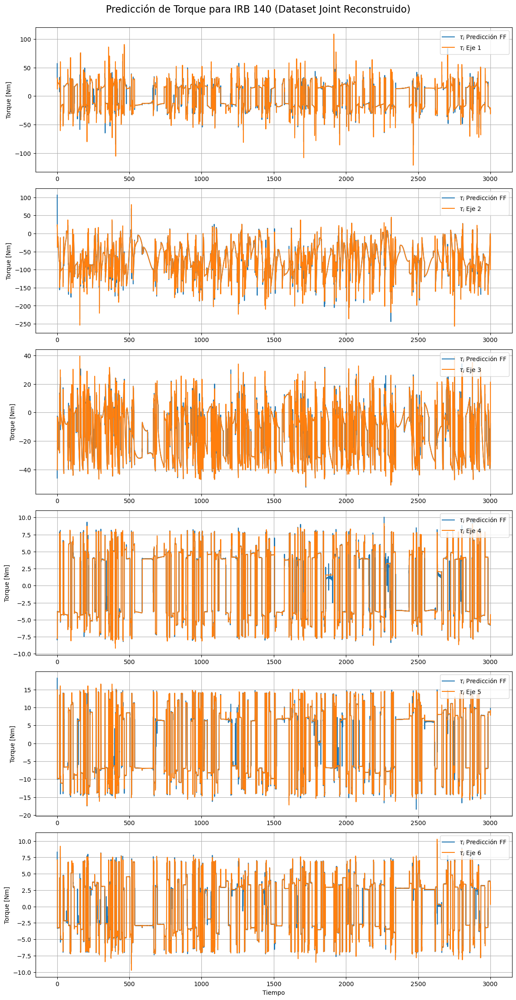

In [163]:
num_links = 6
# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Predicción de Torque para IRB 140 (Dataset Joint Reconstruido)", fontsize=16, y=0.95)

# Grafico los resultados
for i in range(num_links):
  plt.subplot(num_links, 1, i+1)
  plt.plot(time_SIM,tau_sim_FF_SIM[:,i])
  plt.plot(time_SIM,outputs_SIM[:,i])
  plt.ylabel('Torque [Nm]')
  plt.legend([r"$\tau_{i}$ Predicción FF", r"$\tau_{i}$ " f'Eje {i+1}'],loc='upper right', 
             fontsize=10)
  plt.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.xlabel('Tiempo');
plt.show()

Eje 1:
FF - MAE: 2.809630e-01, MSE: 2.211774e+00, R²: 0.9949646870
Eje 2:
FF - MAE: 4.418300e-01, MSE: 3.020345e+00, R²: 0.9977750715
Eje 3:
FF - MAE: 2.830945e-01, MSE: 2.532297e+00, R²: 0.9907979155
Eje 4:
FF - MAE: 6.364991e-02, MSE: 1.384003e-01, R²: 0.9943535599
Eje 5:
FF - MAE: 8.124463e-02, MSE: 3.574077e-01, R²: 0.9959593759
Eje 6:
FF - MAE: 3.920340e-02, MSE: 5.906280e-02, R²: 0.9966030816


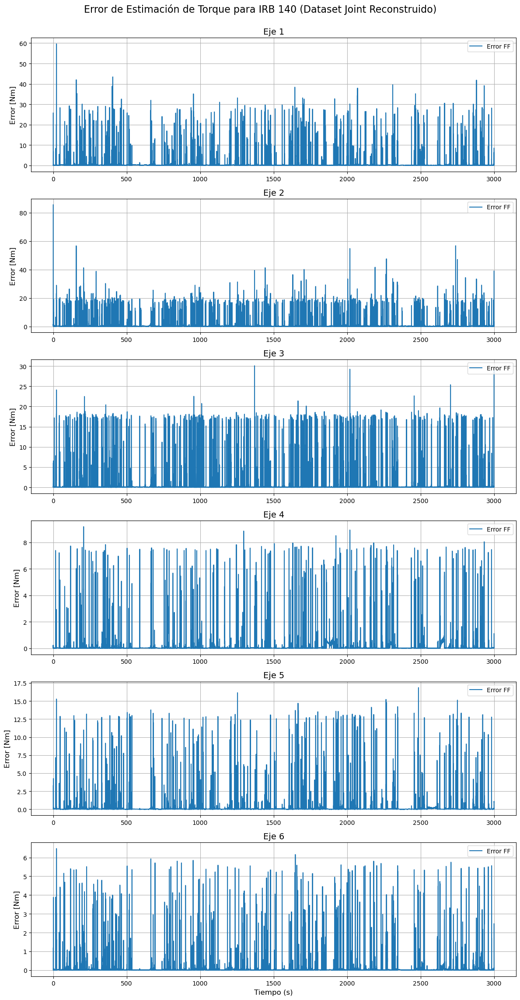

In [164]:
# Ajustar el tamaño de la figura
plt.figure(figsize=(12, 24))  # Cambia el tamaño según tus necesidades

# Agregar un título general
plt.suptitle("Error de Estimación de Torque para IRB 140 (Dataset Joint Reconstruido)", 
             fontsize=16,  y=0.95)

# Graficar los errores
for i in range(num_links):
    plt.subplot(num_links, 1, i + 1)
    y_true = outputs_SIM[:, i]            # Señal real 
    y_pred_ff = tau_sim_FF_SIM[:, i]     # Predicción FF

    # MAE
    mae_ff = mean_absolute_error(y_true[:], y_pred_ff)

    # MSE
    mse_ff = mean_squared_error(y_true[:], y_pred_ff)

    # R²
    r2_ff = r2_score(y_true[:], y_pred_ff)

    # Imprimir resultados
    print(f"Eje {i+1}:")
    print(f"FF - MAE: {mae_ff:.6e}, MSE: {mse_ff:.6e}, R²: {r2_ff:.10f}")

    error_FF_SIM = np.sqrt((tau_sim_FF_SIM[:, i] - outputs_SIM[:, i])**2)
    
    # Graficar los errores
    plt.plot(time_SIM, error_FF_SIM, label='Error FF')
    
    # Ajustar etiquetas y título del subplot
    plt.ylabel(r'Error [Nm]', fontsize=12)
    plt.title(f'Eje {i+1}', fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(True)  # Añadir una cuadrícula para facilitar la lectura

# Etiqueta para el eje X
plt.xlabel('Tiempo (s)', fontsize=12)

#plt.tight_layout(rect=[0, 0, 1, 0.95])  

# Ajustar los espacios entre subplots
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Dejar espacio para el título general

# Mostrar el gráfico
plt.show()
